# YouTube Comments EDA — Comprehensive Exploratory Data Analysis

**Dataset**: YouTube Comments with Engagement Metrics & Sentiment Labels  
**Rows**: ~395,000 | **Labeled subset**: ~362,000 comments  
**Author**: Intro to Data Science Course  
**Date**: 2026-05-07

---

## Table of Contents

1. [Environment Setup & Configuration](#1-environment-setup--configuration)
2. [Data Loading & Memory Optimisation](#2-data-loading--memory-optimisation)
3. [Data Overview & Structure](#3-data-overview--structure)
4. [Data Quality Assessment](#4-data-quality-assessment)
5. [Univariate Statistical Analysis](#5-univariate-statistical-analysis)
6. [Distributions & Visualisations](#6-distributions--visualisations)
7. [Text Analysis](#7-text-analysis)
8. [Temporal Analysis](#8-temporal-analysis)
9. [Bivariate & Multivariate Analysis](#9-bivariate--multivariate-analysis)
10. [Labeled Data / Sentiment Analysis](#10-labeled-data--sentiment-analysis)
11. [Key Insights & Recommendations](#11-key-insights--recommendations)

---

## 1. Environment Setup & Configuration

Import all required libraries, configure global settings for reproducibility, and define the visual theme used throughout the notebook.

In [1]:
# Core libraries
import sys
import os
import gc
import warnings

from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import seaborn as sns
from scipy import stats as sp_stats

# Text & NLP
import nltk

# Visualisation settings
import src.plots as plots

# Statistical helpers
from src.stats import (
    describe_numeric, mode_value, frequency_table,
    detect_outliers_iqr, detect_outliers_zscore, outlier_summary,
    correlation_matrix, top_correlations, distribution_stats,
    grouped_stats, engagement_tier,
)

# Text analysis helpers
from src.text_analysis import (
    extract_emojis, emoji_count, top_emojis,
    clean_text_basic, simple_tokenize,
    extract_ngrams, plot_wordcloud,
    uppercase_ratio, engagement_by_length,
    sentiment_word_summary,
)

warnings.filterwarnings("ignore")

In [2]:
# ── Global plot configuration ────────────────────────────────────────────────
plots.configure_style(style="whitegrid")
COLOR_PRIMARY = "#4C72B0"
COLOR_SECONDARY = "#DD8452"
COLOR_TERTIARY = "#55A868"
COLOR_QUATERNARY = "#C44E52"

# Pandas display options
pd.set_option("display.max_columns", 30)
pd.set_option("display.max_rows", 50)
pd.set_option("display.float_format", "{:.3f}".format)
pd.set_option("display.max_colwidth", 80)
pd.set_option("display.width", 200)

# Paths
DATA_DIR = Path("data")
MAIN_CSV = DATA_DIR / "final_dataset.csv"
LABELED_DIR = DATA_DIR / "labeled"

print(f"Python: {sys.version.split()[0]}")
print(f"NumPy:  {np.__version__}")
print(f"Pandas: {pd.__version__}")
print(f"Seaborn: {sns.__version__}")

Python: 3.11.15
NumPy:  1.26.4
Pandas: 2.3.3
Seaborn: 0.13.2


In [3]:
# ── Download NLTK resources (first run) ──────────────────────────────────────
for resource in ["punkt", "stopwords", "wordnet", "punkt_tab", "averaged_perceptron_tagger"]:
    try:
        nltk.data.find(f"tokenizers/{resource}" if "punkt" in resource else f"corpora/{resource}")
    except LookupError:
        nltk.download(resource, quiet=True)

print("NLTK resources ready.")

NLTK resources ready.


## 2. Data Loading & Memory Optimisation

Load the main CSV using dtype-optimised reading, then load and concatenate all labeled JSONL files. Show memory footprints before and after optimisation.

In [4]:
from src.loaders import load_main_dataset, load_labeled_jsonl, health_report

print("Loading main dataset (final_dataset.csv)...")
df = load_main_dataset(MAIN_CSV, verbose=True)

Loading main dataset (final_dataset.csv)...
[load_main_dataset] Total rows in CSV: 395,633
[load_main_dataset] Loading from: data/final_dataset.csv
[_apply_dtypes] Custom dtypes applied.
[memory] After dtype optimisation: 272.38 MB


In [5]:
print("\nLoading labeled JSONL files (this may take a moment)...")
# Load a sample of label files first to check structure
df_labels_sample = load_labeled_jsonl(LABELED_DIR, limit_files=5, verbose=True)
print(f"\nLabel schema — columns: {df_labels_sample.columns.tolist()}")
print(f"Labels distribution (sample):\n{df_labels_sample['label'].value_counts()}")


Loading labeled JSONL files (this may take a moment)...
[load_labeled_jsonl] Found 5 JSONL files


Loading label files: 100%|██████████| 5/5 [00:00<00:00, 286.23file/s]

[load_labeled_jsonl] Loaded 5,536 label records
[memory] Labels DataFrame: 3.05 MB

Label schema — columns: ['schema_version', 'source_file', 'source_row', 'comment_id', 'post_id', 'label', 'model', 'labeled_at', 'confidence', 'reason']
Labels distribution (sample):
label
positive    1972
negative    1785
neutral     1779
Name: count, dtype: int64


In [6]:
# Load ALL labeled data (full corpus)
df_labels = load_labeled_jsonl(LABELED_DIR, verbose=True)
print(f"\nLabeled records: {len(df_labels):,}")
print(f"Unique labels: {df_labels['label'].unique().tolist()}")
gc.collect()

[load_labeled_jsonl] Found 362 JSONL files


Loading label files: 100%|██████████| 362/362 [00:01<00:00, 250.71file/s]


[load_labeled_jsonl] Loaded 425,636 label records
[memory] Labels DataFrame: 233.93 MB

Labeled records: 425,636
Unique labels: ['neutral', 'positive', 'negative']


0

In [7]:
# ── Merge labeled sentiment onto main dataset ──────────────────────────────────
df_full = df.merge(
    df_labels[["comment_id", "label", "model", "labeled_at"]],
    on="comment_id",
    how="left",
)
print(f"After merge — shape: {df_full.shape}")
print(f"Rows with sentiment label: {df_full['label'].notna().sum():,} ({df_full['label'].notna().mean():.1%})")
gc.collect()

After merge — shape: (425636, 24)
Rows with sentiment label: 425,636 (100.0%)


0

## 3. Data Overview & Structure

Inspect column dtypes, the health report, and categorise columns by type for targeted analysis downstream.

In [8]:
# ── Shape summary ─────────────────────────────────────────────────────────────
print(f"{'═'*60}")
print(f"{'Main DataFrame':<20}  {df.shape[0]:>10,} rows  × {df.shape[1]:>3} columns")
print(f"{'Label DataFrame':<20}  {df_labels.shape[0]:>10,} rows  × {df_labels.shape[1]:>3} columns")
print(f"{'Merged DataFrame':<20} {df_full.shape[0]:>10,} rows  × {df_full.shape[1]:>3} columns")
print(f"{'═'*60}")

════════════════════════════════════════════════════════════
Main DataFrame           395,633 rows  ×  21 columns
Label DataFrame          425,636 rows  ×  10 columns
Merged DataFrame        425,636 rows  ×  24 columns
════════════════════════════════════════════════════════════


In [9]:
# ── Column dtypes & nulls ─────────────────────────────────────────────────────
print("\n── Main DataFrame .info() ──\n")
df.info(memory_usage="deep")


── Main DataFrame .info() ──

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 395633 entries, 0 to 395632
Data columns (total 21 columns):
 #   Column             Non-Null Count   Dtype              
---  ------             --------------   -----              
 0   comment_id         395633 non-null  string             
 1   post_id            395633 non-null  string             
 2   comment_text       395478 non-null  string             
 3   published_at       395633 non-null  datetime64[ns, UTC]
 4   like_count         395633 non-null  Int32              
 5   reply_count        395633 non-null  Int32              
 6   author_id          395633 non-null  string             
 7   author_name        395630 non-null  string             
 8   title_youtube      395633 non-null  string             
 9   source_query       395633 non-null  category           
 10  crawled_at         395633 non-null  datetime64[ns]     
 11  char_count         395633 non-null  Int32              
 12 

In [10]:
# ── Health report ───────────────────────────────────────────────────────────────
health = health_report(df)
print("\n── Column Health Report ──\n")
health


── Column Health Report ──



,dtype,null_count,null_pct,unique_count,sample_value,memory_mb
column,,,,,,
comment_id,string,0,0.000,395633,UgxVtm4hxy8sDtUnxv94AaABAg,31.233
post_id,string,0,0.000,1331,R1WQVeCq0Hs,25.657
comment_text,string,155,0.039,379754,Colombia y Brazil haciendo historia 🤝,86.874
published_at,"datetime64[ns, UTC]",0,0.000,393676,2026-04-30 21:08:23+00:00,3.019
like_count,Int32,0,0.000,8449,3595,1.887
reply_count,Int32,0,0.000,548,22,1.887
author_id,string,0,0.000,351222,UCwxydqYqou1GKImOqqu6ACg,30.562
author_name,string,3,0.001,351219,@luisguzman-y2d,27.057
title_youtube,string,0,0.000,1320,"Anitta, Shakira - Choka Choka (Official Music Video)",53.722


In [11]:
# ── Column categories ──────────────────────────────────────────────────────────
from src.loaders import COLUMN_CATEGORIES

ID_COLS      = COLUMN_CATEGORIES["id_cols"]
TEXT_COLS    = COLUMN_CATEGORIES["text_cols"]
NUMERIC_COLS = COLUMN_CATEGORIES["numeric_cols"]
DT_COLS      = COLUMN_CATEGORIES["datetime_cols"]
CAT_COLS     = COLUMN_CATEGORIES["categorical_cols"]

print("── Column Categories ──")
for name, cols in COLUMN_CATEGORIES.items():
    print(f"  {name:<20}: {cols}")

── Column Categories ──
  id_cols             : ['comment_id', 'post_id', 'author_id']
  text_cols           : ['comment_text', 'author_name', 'title_youtube', 'source_query']
  numeric_cols        : ['like_count', 'reply_count', 'char_count', 'word_count', 'avg_word_length', 'uppercase_ratio', 'exclamation_count', 'question_count', 'hashtag_count', 'mention_count', 'emoji_count', 'like_count_log']
  datetime_cols       : ['published_at', 'crawled_at']
  categorical_cols    : ['source_query']


In [12]:
# ── Sample rows ────────────────────────────────────────────────────────────────
print("── First 5 rows ──\n")
df.head()

── First 5 rows ──



,comment_id,post_id,comment_text,published_at,like_count,reply_count,author_id,author_name,title_youtube,source_query,crawled_at,char_count,word_count,avg_word_length,uppercase_ratio,exclamation_count,question_count,hashtag_count,mention_count,emoji_count,like_count_log
0,UgxVtm4hxy8sDtUnxv94AaABAg,R1WQVeCq0Hs,Colombia y Brazil haciendo historia 🤝,2026-04-30 21:08:23+00:00,3595,22,UCwxydqYqou1GKImOqqu6ACg,@luisguzman-y2d,"Anitta, Shakira - Choka Choka (Official Music Video)",official music video,2026-05-02 04:45:31,37,6,5.333,0.054,0,0,0,0,1,8.188
1,UgzNM-cNmiDziXizsRB4AaABAg,R1WQVeCq0Hs,O sol e a lua Shakira e Anitta 🔮,2026-04-30 19:07:39+00:00,3947,12,UCxOubQ9oLFIowExe87Knhpw,@ricardovicente1064,"Anitta, Shakira - Choka Choka (Official Music Video)",official music video,2026-05-02 04:45:31,32,9,2.667,0.088,0,0,0,0,1,8.281
2,Ugyk1pkJ6dtfPaQBsZp4AaABAg,R1WQVeCq0Hs,O ECLIPSE IRMÃOS ELAS ESTÃO VINDO,2026-04-30 19:10:53+00:00,1575,0,UCHIEwFe2fOaybuEX9pNW7fA,@lucastorquato5195,"Anitta, Shakira - Choka Choka (Official Music Video)",official music video,2026-05-02 04:45:31,33,6,4.667,0.824,0,0,0,0,0,7.363
3,Ugw8riDxbs4mhPWXuA94AaABAg,R1WQVeCq0Hs,Gente é histórico culturalmente esse álbum da Anitta,2026-05-01 15:20:35+00:00,191,0,UCNZFT65Tb48PI48fivJhBcA,@yuriraphaell,"Anitta, Shakira - Choka Choka (Official Music Video)",official music video,2026-05-02 04:45:31,52,8,5.625,0.038,0,0,0,0,0,5.257
4,UgyAGclKh3tZFJCbflR4AaABAg,R1WQVeCq0Hs,Necesito una extended version 🇲🇽,2026-04-30 22:23:08+00:00,612,1,UC1fe1xLD8RNP2BLu_MEcgyg,@MOISEX08,"Anitta, Shakira - Choka Choka (Official Music Video)",official music video,2026-05-02 04:45:31,32,5,5.600,0.031,0,0,0,0,1,6.418


In [13]:
# ── Unique value counts ────────────────────────────────────────────────────────
print("── Unique value counts (top 5 per category) ──\n")
for col in ID_COLS + CAT_COLS:
    print(f"  {col:<20} {df[col].nunique():>10,} unique")

── Unique value counts (top 5 per category) ──

  comment_id              395,633 unique
  post_id                   1,331 unique
  author_id               351,222 unique
  source_query                 37 unique


In [14]:
# ── Date range ─────────────────────────────────────────────────────────────────
print("── Date Range ──")
print(f"  published_at : {df['published_at'].min()}  →  {df['published_at'].max()}")
print(f"  crawled_at    : {df['crawled_at'].min()}  →  {df['crawled_at'].max()}")
print(f"  labeled_at    : {df_labels['labeled_at'].min()}  →  {df_labels['labeled_at'].max()}")

── Date Range ──
  published_at : 2009-12-30 12:03:39+00:00  →  2026-05-02 05:25:50+00:00
  crawled_at    : 2026-05-02 04:45:31  →  2026-05-02 05:30:42
  labeled_at    : 2026-05-02 20:47:41.453026+00:00  →  2026-05-03 18:45:27.754002+00:00


## 4. Data Quality Assessment

Examine missing values, duplicate rows, invalid entries, and outlier statistics across all numeric columns.

── Columns with Missing Values ──

  comment_text                 0.04%  (155 / 395,633)
  author_name                  0.00%  (3 / 395,633)


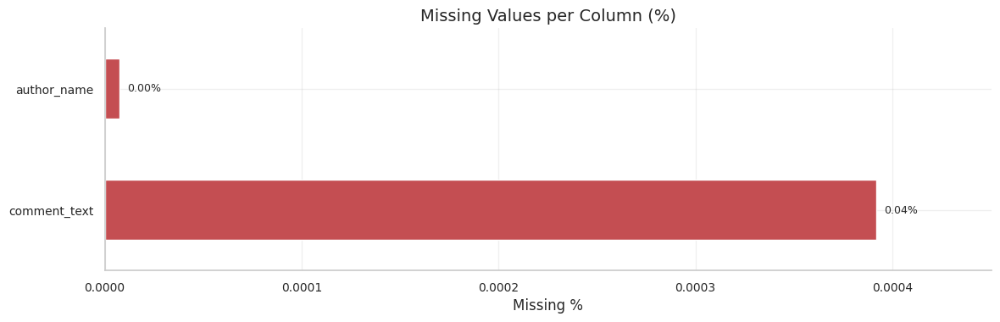

In [15]:
# ── Missing values ─────────────────────────────────────────────────────────────
missing_pct = df.isnull().mean() * 100
missing_cols = missing_pct[missing_pct > 0].sort_values(ascending=False)

if len(missing_cols) > 0:
    print("── Columns with Missing Values ──\n")
    for col, pct in missing_cols.items():
        print(f"  {col:<25}  {pct:>6.2f}%  ({df[col].isnull().sum():,} / {len(df):,})")
else:
    print("No missing values found in the dataset.")

fig, ax = plt.subplots(figsize=(12, max(4, len(missing_cols) * 0.35)))
plots.plot_missing(df, ax=ax, title="Missing Values per Column (%)")
plt.tight_layout()
plt.show()

In [16]:
# ── Duplicate rows ─────────────────────────────────────────────────────────────
print("── Duplicate Analysis ──\n")

# Exact duplicates (all columns)
exact_dup = df.duplicated().sum()
print(f"  Exact duplicate rows  : {exact_dup:,}")

# Duplicate comment_ids
dup_ids = df["comment_id"].duplicated().sum()
print(f"  Duplicate comment_ids  : {dup_ids:,}")

# Near-duplicate comment_text (exact string matches)
dup_text = df["comment_text"].duplicated().sum()
print(f"  Duplicate comment_text : {dup_text:,}")

# Show a few duplicate comment_ids if any
if dup_ids > 0:
    print("\n── Sample duplicate comment_ids ──\n")
    dup_id_examples = df[df["comment_id"].duplicated(keep=False)]["comment_id"].unique()[:3]
    for cid in dup_id_examples:
        display(df[df["comment_id"] == cid][["comment_id", "comment_text", "like_count"]].head(3))

── Duplicate Analysis ──

  Exact duplicate rows  : 0
  Duplicate comment_ids  : 0
  Duplicate comment_text : 15,878


In [17]:
# ── Invalid values ────────────────────────────────────────────────────────────
print("── Invalid Value Checks ──\n")

# Negative counts
for col in ["like_count", "reply_count", "char_count", "word_count", "exclamation_count", "question_count"]:
    if col in df.columns:
        neg = (df[col] < 0).sum()
        print(f"  Negative {col:<25}: {neg:,}")

# Future dates
now = pd.Timestamp.now(tz="UTC")
future_dates = df["published_at"] > now
print(f"  Future published_at dates    : {future_dates.sum():,}")

# Zero-length comments
zero_len = (df["char_count"] == 0).sum()
print(f"  Zero-length comments          : {zero_len:,}")

# Missing comment_text
missing_text = df["comment_text"].isna().sum()
print(f"  Missing comment_text          : {missing_text:,}")

── Invalid Value Checks ──

  Negative like_count               : 0
  Negative reply_count              : 0
  Negative char_count               : 0
  Negative word_count               : 0
  Negative exclamation_count        : 2
  Negative question_count           : 0
  Future published_at dates    : 0
  Zero-length comments          : 155
  Missing comment_text          : 155


In [18]:
# ── Outlier detection (IQR & Z-score) ────────────────────────────────────────
outlier_results = outlier_summary(df, numeric_cols=NUMERIC_COLS, methods=("iqr", "zscore"))

print("── Outlier Summary (IQR method, multiplier=1.5) ──\n")
display(outlier_results["iqr"][["lower_bound", "upper_bound", "outlier_count", "outlier_pct"]])

print("\n── Outlier Summary (Z-score method, threshold=3.0) ──\n")
display(outlier_results["zscore"][["median", "mad", "threshold", "outlier_count", "outlier_pct"]])

── Outlier Summary (IQR method, multiplier=1.5) ──



,lower_bound,upper_bound,outlier_count,outlier_pct
like_count,-60.000,100.000,76229,19.268
reply_count,-1.500,2.500,74260,18.770
char_count,-74.000,206.000,32824,8.297
word_count,-15.000,41.000,30462,7.700
avg_word_length,2.198,6.115,26445,6.684
uppercase_ratio,-0.050,0.130,37758,9.544
exclamation_count,0.000,0.000,54108,13.676
question_count,0.000,0.000,35240,8.907
hashtag_count,0.000,0.000,1433,0.362
mention_count,0.000,0.000,546,0.138



── Outlier Summary (Z-score method, threshold=3.0) ──



,median,mad,threshold,outlier_count,outlier_pct
like_count,3.000,3.000,3.000,123160,31.130
reply_count,0.000,0.000,3.000,0,0.000
char_count,57.000,31.000,3.000,36222,9.155
word_count,11.000,6.000,3.000,36135,9.133
avg_word_length,4.154,0.487,3.000,21456,5.423
uppercase_ratio,0.034,0.020,3.000,40962,10.354
exclamation_count,0.000,0.000,3.000,0,0.000
question_count,0.000,0.000,3.000,0,0.000
hashtag_count,0.000,0.000,3.000,0,0.000
mention_count,0.000,0.000,3.000,0,0.000


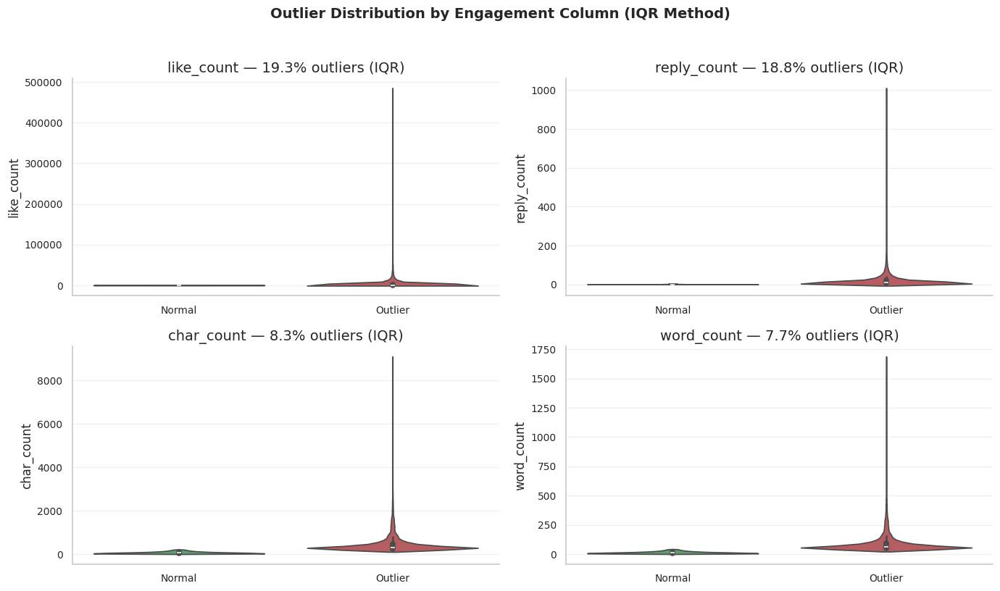

In [19]:
# Visualise outlier distribution for engagement columns
engage_cols = ["like_count", "reply_count", "char_count", "word_count"]

fig, axes = plt.subplots(2, 2, figsize=(14, 8))
axes = axes.flatten()
colors = plots.get_colors(4)

for i, col in enumerate(engage_cols):
    o = detect_outliers_iqr(df[col])
    labels = np.where(o["is_outlier"], "Outlier", "Normal")
    sns.violinplot(x=labels, y=df[col], ax=axes[i], palette=["#55A868", "#C44E52"], order=["Normal", "Outlier"])
    axes[i].set_title(f"{col} — {o['outlier_pct']:.1f}% outliers (IQR)")
    axes[i].set_xlabel("")

plt.suptitle("Outlier Distribution by Engagement Column (IQR Method)", fontsize=14, fontweight="bold", y=1.02)
plt.tight_layout()
plt.show()

## 5. Univariate Statistical Analysis

Comprehensive descriptive statistics, central tendency measures, dispersion metrics, and distribution shape diagnostics for all numeric columns.

In [20]:
# ── Descriptive statistics ────────────────────────────────────────────────────
desc = describe_numeric(df, cols=NUMERIC_COLS)
print("── Extended Descriptive Statistics ──\n")
display(desc)

── Extended Descriptive Statistics ──



,like_count,reply_count,char_count,word_count,avg_word_length,uppercase_ratio,exclamation_count,question_count,hashtag_count,mention_count,emoji_count,like_count_log
count,395633.000,395633.000,395633.000,395633.000,395633.000,395633.000,395633.000,395633.000,395633.000,395633.000,395633.000,395633.000
mean,306.306,4.077,95.746,18.590,4.236,0.072,0.316,0.138,0.005,0.002,0.722,2.211
std,2406.248,22.036,171.216,32.045,2.286,0.143,1.323,0.659,0.105,0.062,2.204,2.381
min,0.000,0.000,0.000,0.000,0.000,0.000,-86.000,0.000,0.000,0.000,-124.000,0.000
1%,0.000,0.000,4.000,1.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
5%,0.000,0.000,12.000,2.000,2.643,0.000,0.000,0.000,0.000,0.000,0.000,0.000
25%,0.000,0.000,31.000,6.000,3.667,0.017,0.000,0.000,0.000,0.000,0.000,0.000
50%,3.000,0.000,57.000,11.000,4.154,0.034,0.000,0.000,0.000,0.000,0.000,1.386
75%,40.000,1.000,101.000,20.000,4.646,0.062,0.000,0.000,0.000,0.000,1.000,3.714
95%,1018.000,18.000,279.000,53.000,5.833,0.273,2.000,1.000,0.000,0.000,4.000,6.927


In [21]:
# ── Central tendency & dispersion ────────────────────────────────────────────
engage_cols = ["like_count", "reply_count", "char_count", "word_count"]

print("── Central Tendency & Dispersion (Engagement Columns) ──\n")
ct_rows = []
for col in engage_cols:
    s = df[col].dropna()
    ct_rows.append({
        "column": col,
        "mean": s.mean(),
        "median": s.median(),
        "mode": s.mode().iloc[0] if not s.mode().empty else np.nan,
        "std": s.std(),
        "variance": s.var(),
        "cv (coef. of variation)": s.std() / s.mean() if s.mean() != 0 else np.nan,
        "skewness": s.skew(),
        "kurtosis": s.kurt(),
    })

ct_df = pd.DataFrame(ct_rows).set_index("column").round(4)
display(ct_df)

── Central Tendency & Dispersion (Engagement Columns) ──



,mean,median,mode,std,variance,cv (coef. of variation),skewness,kurtosis
column,,,,,,,,
like_count,306.306,3.000,0,2406.248,5790027.377,7.856,47.020,5442.859
reply_count,4.077,0.000,0,22.036,485.575,5.405,19.421,566.348
char_count,95.746,57.000,25,171.216,29314.847,1.788,11.013,233.413
word_count,18.590,11.000,6,32.045,1026.875,1.724,10.869,226.714


In [22]:
# ── Frequency analysis: source_query ──────────────────────────────────────────
print("── Frequency: source_query ──\n")
display(frequency_table(df["source_query"], n=15))

── Frequency: source_query ──



,value,count,pct,cum_count,cum_pct
0,Beyonce official music video,19999,5.055,19999,5.055
1,Billie Eilish official music video,19324,4.884,39323,9.939
2,Ariana Grande official music video,19074,4.821,58397,14.760
3,worst movie ever,18728,4.734,77125,19.494
4,live concert performance,18529,4.683,95654,24.177
5,live session performance,18371,4.643,114025,28.821
6,reaction to music video,17276,4.367,131301,33.188
7,movie analysis,16584,4.192,147885,37.379
8,Ariana Grande live performance,16414,4.149,164299,41.528
9,worst song ever,16134,4.078,180433,45.606


In [23]:
# ── Frequency analysis: top authors ──────────────────────────────────────────
print("── Top 15 Authors by Comment Count ──\n")
display(frequency_table(df["author_name"], n=15))

── Top 15 Authors by Comment Count ──



,value,count,pct,cum_count,cum_pct
0,@EdersonBuanaCorreia,151,0.038,151,0.038
1,@pabloadduci,106,0.027,257,0.065
2,@Rasim9898,76,0.019,333,0.084
3,@antoniacontreras9130,64,0.016,397,0.100
4,@eloisebanting9501,63,0.016,460,0.116
5,@TonyMchugh-r6l,56,0.014,516,0.130
6,@RichardStarnes-k9c,55,0.014,571,0.144
7,@KindlyHelpMeReach99Ksubscr-x2y,55,0.014,626,0.158
8,@gabriellsilvalima8610,55,0.014,681,0.172
9,@danieltempleton2887,51,0.013,732,0.185


In [24]:
# ── Frequency analysis: top YouTube videos ─────────────────────────────────────
print("── Top 15 YouTube Videos by Comment Count ──\n")
display(frequency_table(df["title_youtube"], n=15))

── Top 15 YouTube Videos by Comment Count ──



,value,count,pct,cum_count,cum_pct
0,Michael - Movie Review,800,0.202,800,0.202
1,Clayface | Official Teaser,800,0.202,1600,0.404
2,Ariana Grande - Break Free (Live on the Honda Stage at the iHeartRadio Theat...,800,0.202,2400,0.607
3,Billie Eilish - WILDFLOWER (Music Video),800,0.202,3200,0.809
4,Michael - Movie Review!,791,0.200,3991,1.009
5,Billie Eilish – WILDFLOWER (Live Performance from Amazon Music’s Songline),402,0.102,4393,1.110
6,Coldplay - A Sky Full Of Stars (Live at River Plate),401,0.101,4794,1.212
7,Scandal's song ( The Album Leaf- The Light),400,0.101,5194,1.313
8,Scandal - The Warrior (Official Video) ft. Patty Smyth,400,0.101,5594,1.414
9,"Scandal, Patty Smyth - Goodbye To You (Official Video)",400,0.101,5994,1.515


## 6. Distributions & Visualisations

Histograms with KDE, box plots, violin plots, and bar charts for all key columns.

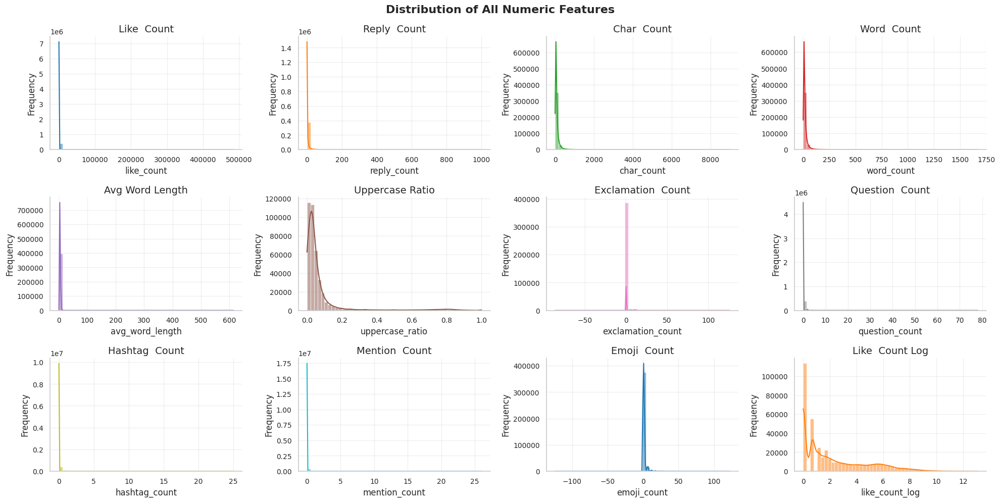

In [25]:
# ── Histogram grid: all numeric columns ────────────────────────────────────────
fig = plots.plot_histogram_grid(df, cols=NUMERIC_COLS, ncols=4, kde=True, stat="count")
fig.suptitle("Distribution of All Numeric Features", fontsize=16, fontweight="bold", y=1.02)
plt.show()

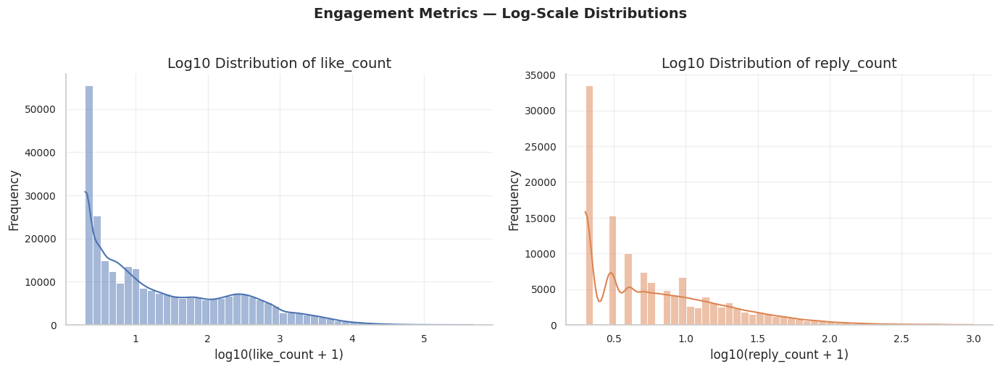

In [26]:
# ── Engagement columns: log-scale histograms ───────────────────────────────────
log_cols = ["like_count", "reply_count"]
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

for i, col in enumerate(log_cols):
    s = df[col].dropna()
    plots.plot_histogram(
        np.log10(s[s > 0] + 1),
        ax=axes[i],
        bins=50,
        kde=True,
        title=f"Log10 Distribution of {col}",
        xlabel=f"log10({col} + 1)",
        color=plots.PALETTE[["primary", "secondary"][i]],
    )

plt.suptitle("Engagement Metrics — Log-Scale Distributions", fontsize=14, fontweight="bold", y=1.02)
plt.tight_layout()
plt.show()

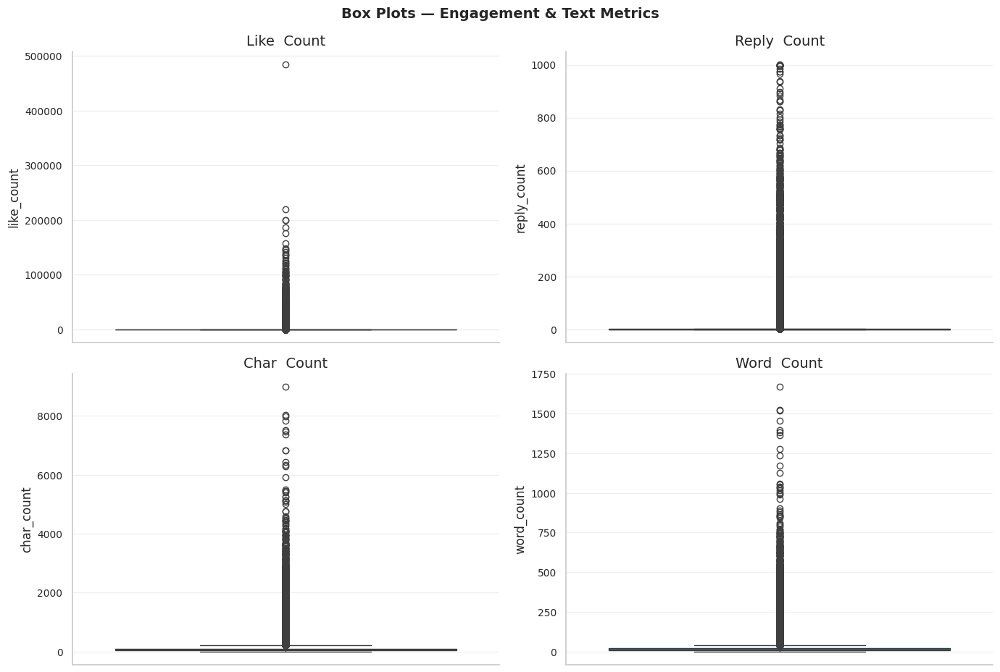

In [27]:
# ── Box plots: engagement metrics ─────────────────────────────────────────────
engage_cols = ["like_count", "reply_count", "char_count", "word_count"]
fig = plots.plot_boxplot_grid(df, cols=engage_cols, ncols=2, figsize_scale=7)
fig.suptitle("Box Plots — Engagement & Text Metrics", fontsize=14, fontweight="bold", y=1.02)
plt.show()

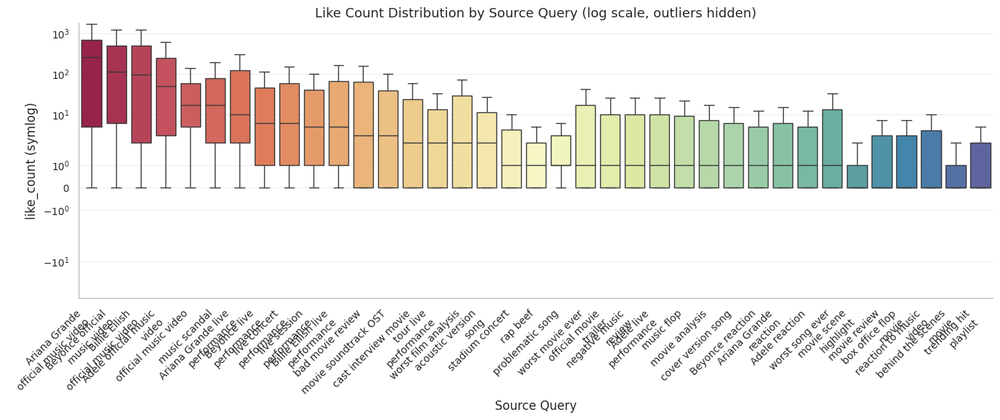

In [28]:
# ── Box plot: like_count by source_query ──────────────────────────────────────
fig, ax = plt.subplots(figsize=(14, 6))
order = df.groupby("source_query")["like_count"].median().sort_values(ascending=False).index
sns.boxplot(data=df, x="source_query", y="like_count", order=order, ax=ax,
            palette="Spectral", showfliers=False)
ax.set_yscale("symlog")
ax.set_title("Like Count Distribution by Source Query (log scale, outliers hidden)", fontsize=13)
ax.set_xlabel("Source Query")
ax.set_ylabel("like_count (symlog)")
plots.wrap_labels(ax, width=20)
plt.tight_layout()
plt.show()

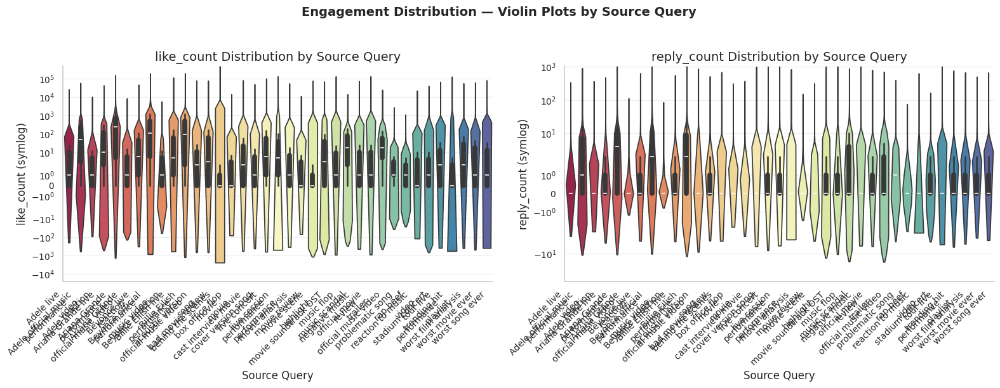

In [29]:
# ── Violin plot: engagement by source_query ───────────────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

for i, (col, ylabel) in enumerate([("like_count", "like_count"), ("reply_count", "reply_count")]):
    sns.violinplot(data=df, x="source_query", y=col, ax=axes[i],
                   palette="Spectral", inner="box")
    axes[i].set_yscale("symlog")
    axes[i].set_title(f"{col} Distribution by Source Query")
    axes[i].set_xlabel("Source Query")
    axes[i].set_ylabel(f"{ylabel} (symlog)")
    plots.wrap_labels(axes[i], width=20)

plt.suptitle("Engagement Distribution — Violin Plots by Source Query", fontsize=14, fontweight="bold", y=1.02)
plt.tight_layout()
plt.show()

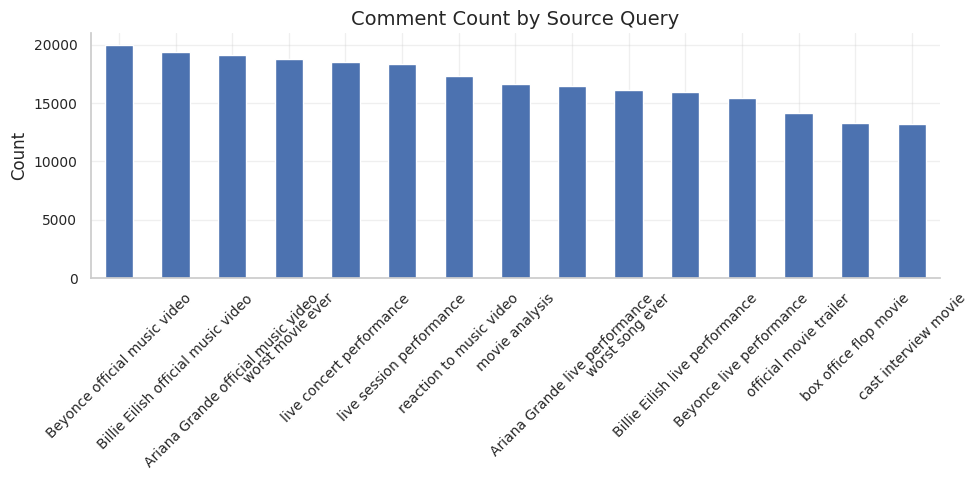

In [30]:
# ── Bar chart: source_query distribution ───────────────────────────────────────
fig, ax = plt.subplots(figsize=(10, 5))
plots.plot_bar(df["source_query"], ax=ax, n=15, title="Comment Count by Source Query",
               xlabel="Number of Comments", palette=[plots.PALETTE["primary"]])
plt.tight_layout()
plt.show()

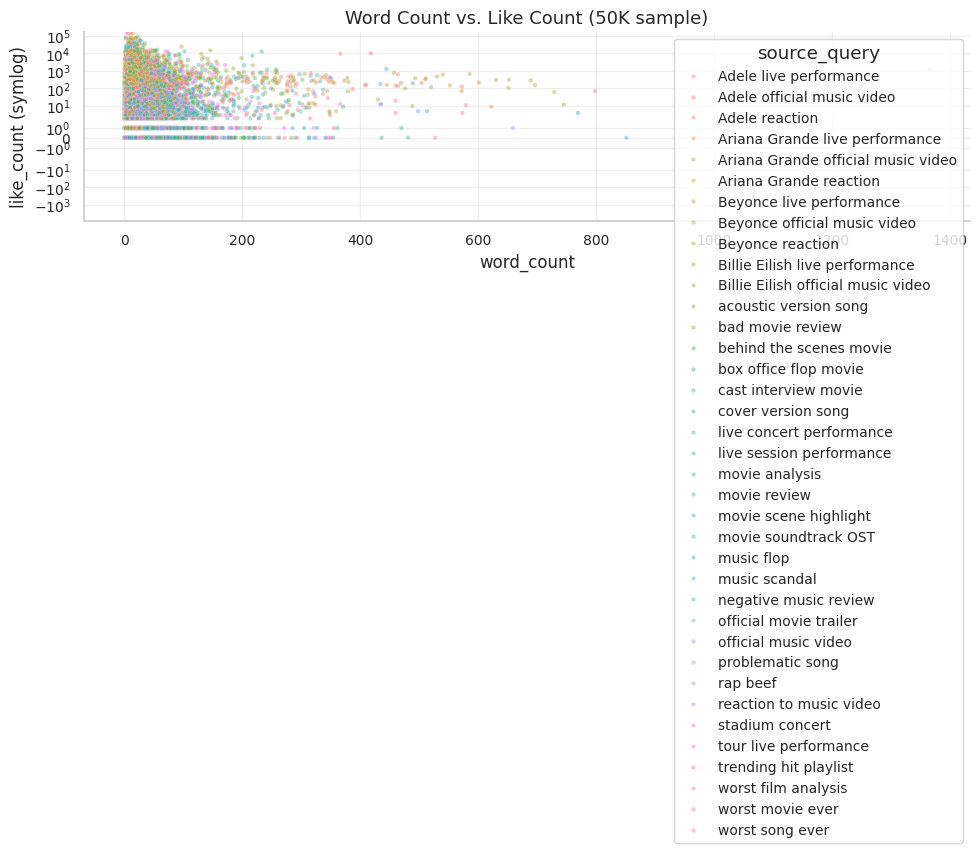

In [31]:
# ── Scatter: word_count vs like_count ─────────────────────────────────────────
fig, ax = plt.subplots(figsize=(10, 6))
sample = df.sample(min(50000, len(df)), random_state=42)
sns.scatterplot(data=sample, x="word_count", y="like_count",
                hue="source_query", alpha=0.4, s=10, ax=ax)
ax.set_yscale("symlog")
ax.set_title("Word Count vs. Like Count (50K sample)", fontsize=13)
ax.set_xlabel("word_count")
ax.set_ylabel("like_count (symlog)")
plt.tight_layout()
plt.show()

## 7. Text Analysis

Comment length distributions, emoji usage patterns, hashtag/mention analysis, uppercase ratios, and n-gram extraction per sentiment class.

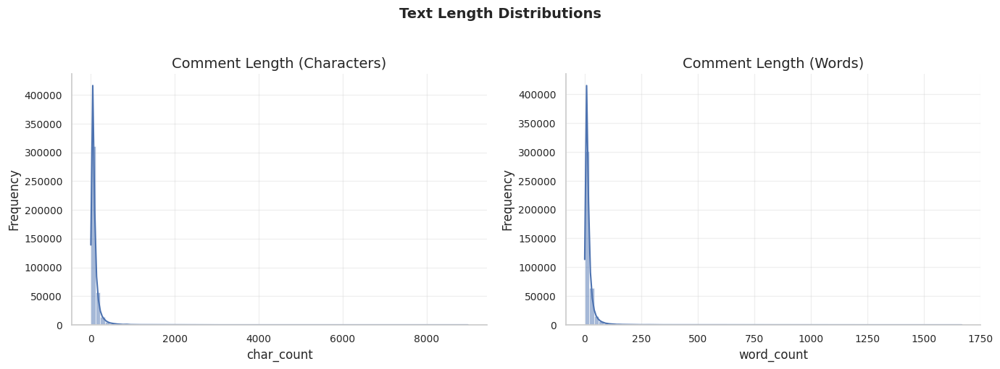

In [32]:
# ── Comment length distribution ───────────────────────────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Character count
plots.plot_histogram(df["char_count"], ax=axes[0], bins=80, kde=True,
                    title="Comment Length (Characters)", xlabel="char_count")

# Word count
plots.plot_histogram(df["word_count"], ax=axes[1], bins=80, kde=True,
                    title="Comment Length (Words)", xlabel="word_count")

plt.suptitle("Text Length Distributions", fontsize=14, fontweight="bold", y=1.02)
plt.tight_layout()
plt.show()

── Engagement Metrics by Comment Length Bin ──



,length_bin,count,mean_likes,median_likes,total_likes
0,0-19,53403,76.810,1.000,4101919
1,20-49,121452,243.990,2.000,29632775
2,50-99,120550,451.810,5.000,54465187
3,100-199,65757,365.540,6.000,24037036
4,200-499,27201,259.430,6.000,7056781
5,500-999,4887,257.070,7.000,1256307
6,1000-49999,2383,266.330,44.000,634666


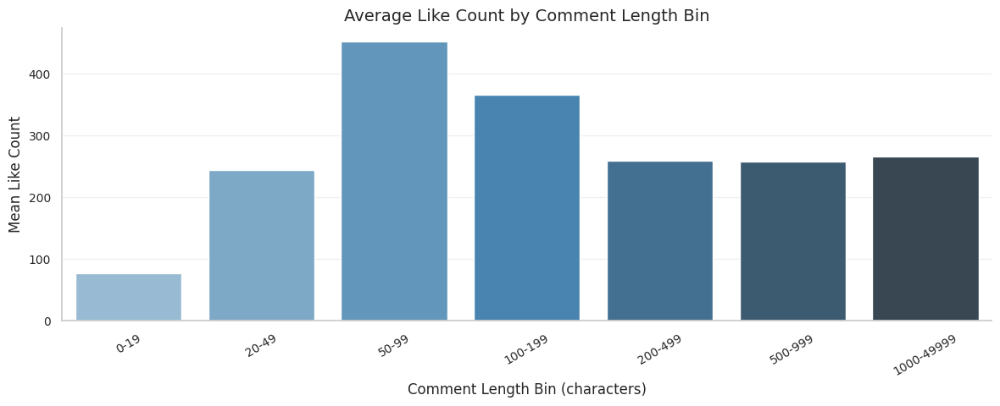

In [33]:
# ── Engagement by comment length bin ─────────────────────────────────────────
eng_by_len = engagement_by_length(df)
print("── Engagement Metrics by Comment Length Bin ──\n")
display(eng_by_len)

fig, ax = plt.subplots(figsize=(12, 5))
sns.barplot(data=eng_by_len, x="length_bin", y="mean_likes", ax=ax,
            palette="Blues_d", errorbar=None)
ax.set_title("Average Like Count by Comment Length Bin")
ax.set_xlabel("Comment Length Bin (characters)")
ax.set_ylabel("Mean Like Count")
ax.tick_params(axis="x", rotation=30)
plt.tight_layout()
plt.show()

── Emoji Usage Statistics ──

  Comments with at least 1 emoji : 108,074 (27.3%)
  Mean emoji count                : 0.722
  Max emoji count                 : 122

── Top 25 Emojis ──



,emoji,count
0,❤,61042
1,😂,27696
2,🔥,14973
3,😭,14024
4,❤️,11113
5,😍,8937
6,🎉,8765
7,😢,6154
8,😊,5440
9,🤣,4212


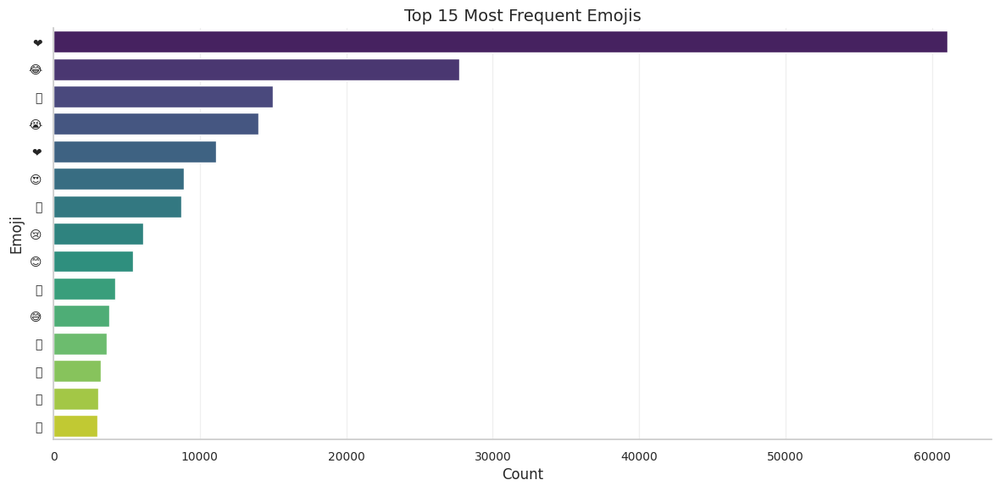

In [34]:
# ── Emoji analysis ────────────────────────────────────────────────────────────
print("── Emoji Usage Statistics ──\n")
print(f"  Comments with at least 1 emoji : {(df['emoji_count'] > 0).sum():,} ({(df['emoji_count'] > 0).mean():.1%})")
print(f"  Mean emoji count                : {df['emoji_count'].mean():.3f}")
print(f"  Max emoji count                 : {df['emoji_count'].max():,}")

# Top emojis
top_emo = top_emojis(df["comment_text"], n=25)
print("\n── Top 25 Emojis ──\n")
display(top_emo)

fig, ax = plt.subplots(figsize=(12, 6))
sns.barplot(data=top_emo.head(15), x="count", y="emoji", ax=ax, palette="viridis")
ax.set_title("Top 15 Most Frequent Emojis")
ax.set_xlabel("Count")
ax.set_ylabel("Emoji")
plt.tight_layout()
plt.show()

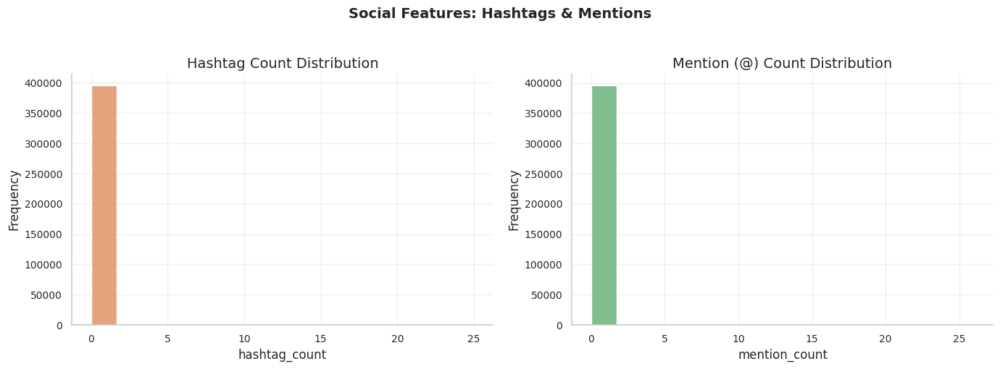

Comments with hashtags : 1,433 (0.4%)
Comments with mentions: 546 (0.1%)


In [35]:
# ── Hashtag & mention analysis ────────────────────────────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

plots.plot_histogram(df["hashtag_count"], ax=axes[0], bins=15, kde=False,
                    title="Hashtag Count Distribution", xlabel="hashtag_count",
                    color=plots.PALETTE["secondary"])

plots.plot_histogram(df["mention_count"], ax=axes[1], bins=15, kde=False,
                    title="Mention (@) Count Distribution", xlabel="mention_count",
                    color=plots.PALETTE["tertiary"])

plt.suptitle("Social Features: Hashtags & Mentions", fontsize=14, fontweight="bold", y=1.02)
plt.tight_layout()
plt.show()

print(f"Comments with hashtags : {(df['hashtag_count'] > 0).sum():,} ({(df['hashtag_count'] > 0).mean():.1%})")
print(f"Comments with mentions: {(df['mention_count'] > 0).sum():,} ({(df['mention_count'] > 0).mean():.1%})")

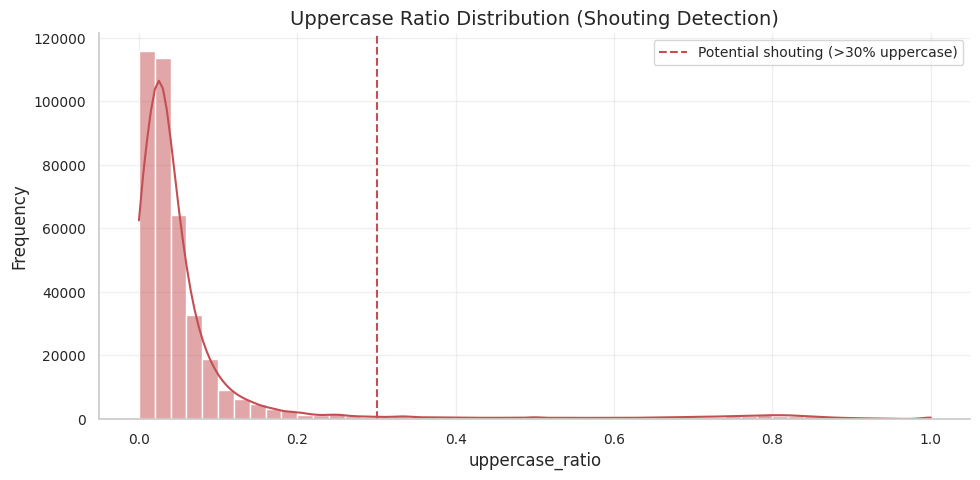

Comments flagged as 'shouting' (>30% uppercase): 4.7%


In [36]:
# ── Uppercase ratio (shouting detection) ─────────────────────────────────────
fig, ax = plt.subplots(figsize=(10, 5))
plots.plot_histogram(df["uppercase_ratio"], ax=ax, bins=50, kde=True,
                    title="Uppercase Ratio Distribution (Shouting Detection)",
                    xlabel="uppercase_ratio", color=plots.PALETTE["quaternary"])
ax.axvline(0.3, color=plots.PALETTE["quaternary"], linestyle="--", linewidth=1.5,
           label="Potential shouting (>30% uppercase)")
ax.legend()
plt.tight_layout()
plt.show()

shouting_pct = (df["uppercase_ratio"] > 0.3).mean()
print(f"Comments flagged as 'shouting' (>30% uppercase): {shouting_pct:.1%}")

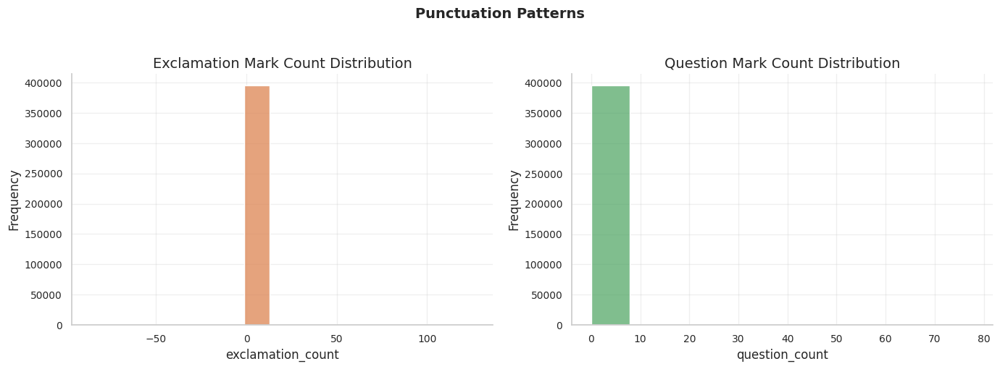

Comments with '!' : 54,106 (13.7%)
Comments with '?' : 35,240 (8.9%)


In [37]:
# ── Exclamation & question mark patterns ──────────────────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

plots.plot_histogram(df["exclamation_count"], ax=axes[0], bins=15, kde=False,
                    title="Exclamation Mark Count Distribution",
                    xlabel="exclamation_count", color=plots.PALETTE["secondary"])

plots.plot_histogram(df["question_count"], ax=axes[1], bins=10, kde=False,
                    title="Question Mark Count Distribution",
                    xlabel="question_count", color=plots.PALETTE["tertiary"])

plt.suptitle("Punctuation Patterns", fontsize=14, fontweight="bold", y=1.02)
plt.tight_layout()
plt.show()

print(f"Comments with '!' : {(df['exclamation_count'] > 0).sum():,} ({(df['exclamation_count'] > 0).mean():.1%})")
print(f"Comments with '?' : {(df['question_count'] > 0).sum():,} ({(df['question_count'] > 0).mean():.1%})")

In [38]:
# ── Top n-grams: all comments ────────────────────────────────────────────────
print("── Top 30 Unigrams (all comments) ──\n")
top_unigrams = extract_ngrams(df["comment_text"], n=1, top_k=30, min_freq=5, remove_stopwords=True)
display(top_unigrams)

print("\n── Top 30 Bigrams (all comments) ──\n")
top_bigrams = extract_ngrams(df["comment_text"], n=2, top_k=30, min_freq=5, remove_stopwords=True)
display(top_bigrams)

── Top 30 Unigrams (all comments) ──



,1-gram,count
0,like,43664
1,song,38623
2,love,38582
3,movie,29790
4,one,29534
5,im,20225
6,time,18470
7,music,17459
8,good,16836
9,know,15506



── Top 30 Bigrams (all comments) ──



,2-gram,count
0,gon na,4592
1,wan na,2958
2,feel like,2429
3,one best,2427
4,first time,2038
5,dont know,1986
6,love song,1961
7,every time,1951
8,looks like,1895
9,ariana grande,1760


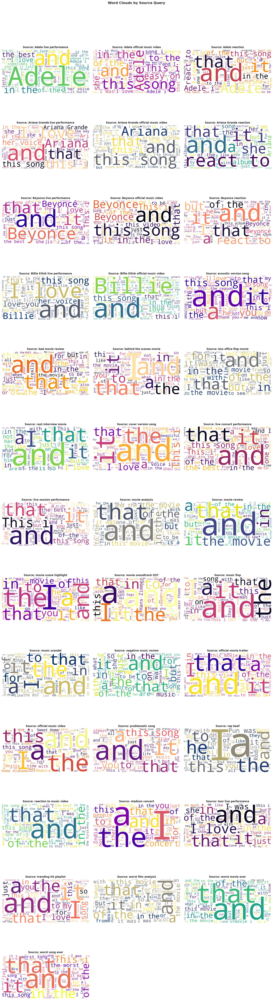

In [39]:
# ── Word clouds by source_query ───────────────────────────────────────────────
query_groups = df.groupby("source_query")["comment_text"].apply(lambda x: " ".join(x.dropna().astype(str)))

n_queries = len(query_groups)
ncols = min(3, n_queries)
nrows = int(np.ceil(n_queries / ncols))

fig, axes = plt.subplots(nrows, ncols, figsize=(6 * ncols, 5 * nrows))
axes = axes.flatten() if n_queries > 1 else [axes]

cmaps = ["viridis", "plasma", "inferno", "magma", "cividis"]
for i, (query, text) in enumerate(query_groups.items()):
    try:
        plot_wordcloud(text, ax=axes[i], colormap=cmaps[i % len(cmaps)], max_words=100)
        axes[i].set_title(f"Source: {query}", fontsize=12, fontweight="bold")
    except Exception as e:
        axes[i].text(0.5, 0.5, f"Error: {e}", ha="center", va="center")

for j in range(i + 1, len(axes)):
    axes[j].set_visible(False)

plt.suptitle("Word Clouds by Source Query", fontsize=16, fontweight="bold", y=1.02)
plt.tight_layout()
plt.show()

## 8. Temporal Analysis

Comment volume over time, engagement trends, and temporal patterns by day-of-week and hour.

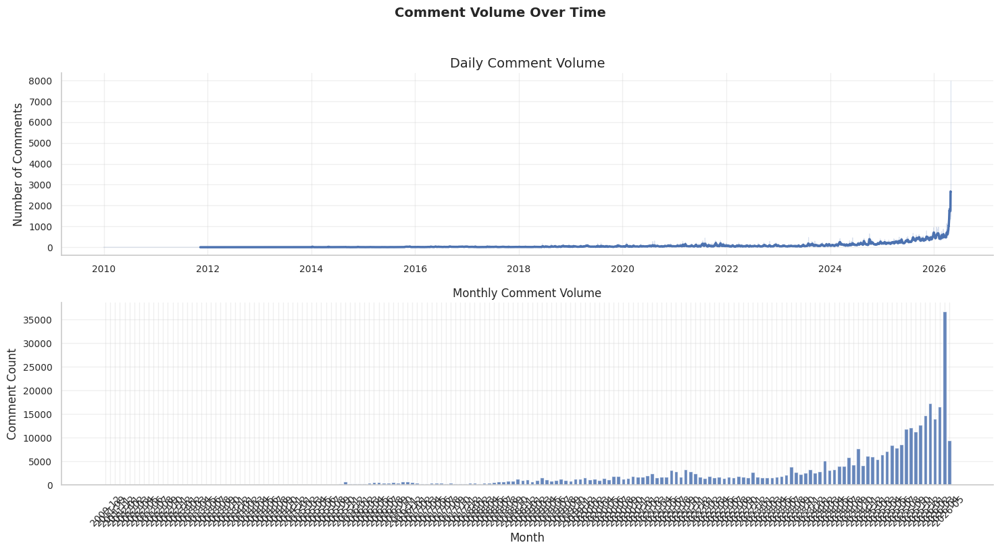

In [40]:
# ── Comment volume over time ───────────────────────────────────────────────────
df_ts = df.copy()
df_ts["published_date"] = df_ts["published_at"].dt.date

daily_counts = df_ts.groupby("published_date").size()

fig, axes = plt.subplots(2, 1, figsize=(15, 8))

# Raw daily counts
plots.plot_time_series(daily_counts, ax=axes[0], title="Daily Comment Volume",
                      ylabel="Number of Comments", rolling=7, color=COLOR_PRIMARY)

# Monthly aggregation
df_ts["published_month"] = df_ts["published_at"].dt.to_period("M")
monthly_counts = df_ts.groupby("published_month").size()
monthly_counts.index = monthly_counts.index.astype(str)

axes[1].bar(monthly_counts.index, monthly_counts.values, color=COLOR_PRIMARY, alpha=0.85)
axes[1].set_title("Monthly Comment Volume", fontsize=12)
axes[1].set_xlabel("Month")
axes[1].set_ylabel("Comment Count")
axes[1].tick_params(axis="x", rotation=45)
sns.despine(ax=axes[1])

plt.suptitle("Comment Volume Over Time", fontsize=14, fontweight="bold", y=1.02)
plt.tight_layout()
plt.show()

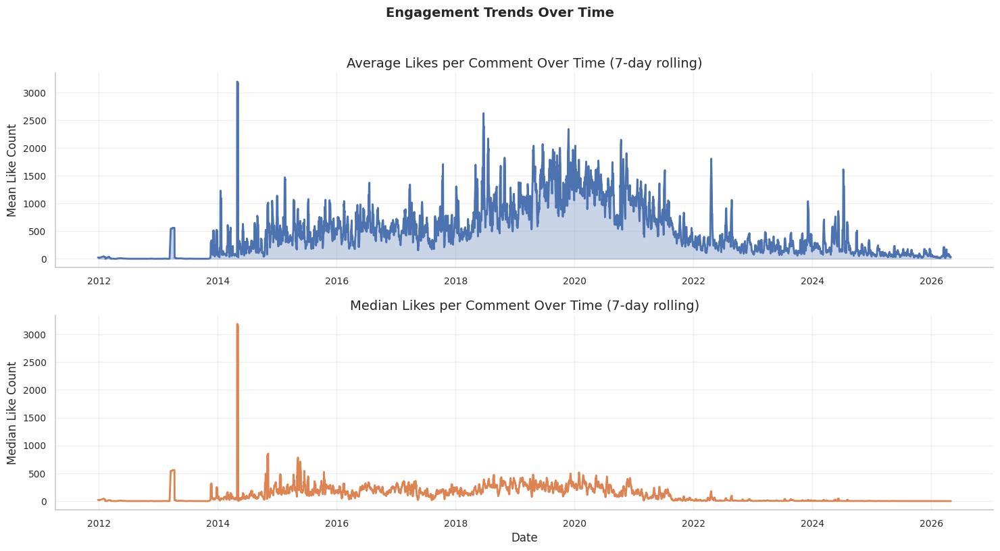

In [41]:
# ── Engagement trends over time ────────────────────────────────────────────────
daily_engagement = df_ts.groupby("published_date").agg(
    mean_likes=("like_count", "mean"),
    median_likes=("like_count", "median"),
    mean_replies=("reply_count", "mean"),
    total_likes=("like_count", "sum"),
).reset_index()
daily_engagement["published_date"] = pd.to_datetime(daily_engagement["published_date"])
daily_engagement = daily_engagement.set_index("published_date").sort_index()

fig, axes = plt.subplots(2, 1, figsize=(15, 8))

axes[0].plot(daily_engagement.index, daily_engagement["mean_likes"].rolling(7).mean(),
             color=COLOR_PRIMARY, linewidth=2, label="7-day rolling mean")
axes[0].fill_between(daily_engagement.index, daily_engagement["mean_likes"].rolling(7).mean(),
                    alpha=0.3, color=COLOR_PRIMARY)
axes[0].set_title("Average Likes per Comment Over Time (7-day rolling)")
axes[0].set_ylabel("Mean Like Count")
sns.despine(ax=axes[0])

axes[1].plot(daily_engagement.index, daily_engagement["median_likes"].rolling(7).mean(),
             color=COLOR_SECONDARY, linewidth=2, label="7-day rolling median")
axes[1].set_title("Median Likes per Comment Over Time (7-day rolling)")
axes[1].set_xlabel("Date")
axes[1].set_ylabel("Median Like Count")
sns.despine(ax=axes[1])

plt.suptitle("Engagement Trends Over Time", fontsize=14, fontweight="bold", y=1.02)
plt.tight_layout()
plt.show()

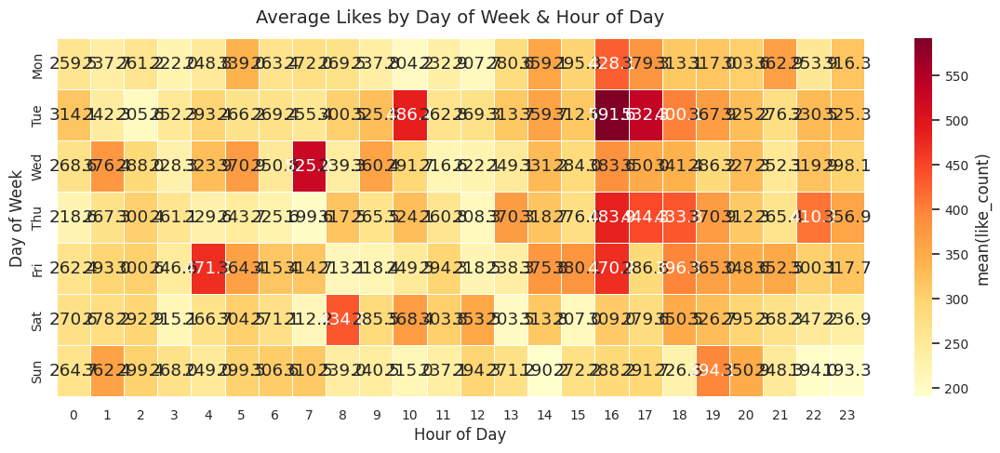

In [42]:
# ── Day-of-week × Hour-of-day heatmap ─────────────────────────────────────────
fig = plots.plot_temporal_heatmap(df, dt_col="published_at", value_col="like_count",
                                  aggfunc="mean",
                                  title="Average Likes by Day of Week & Hour of Day")
plt.show()

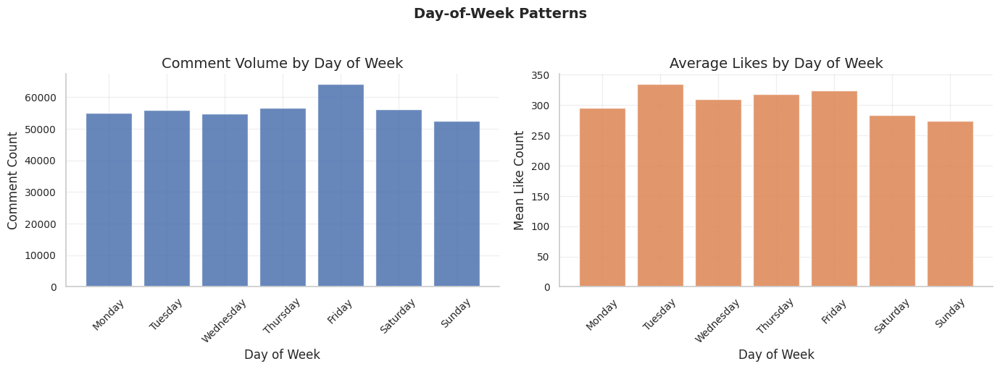

In [43]:
# ── Day-of-week distribution ───────────────────────────────────────────────────
df_ts["dow"] = df_ts["published_at"].dt.day_name()
dow_order = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

dow_counts = df_ts.groupby("dow").size().reindex(dow_order)
axes[0].bar(dow_counts.index, dow_counts.values, color=COLOR_PRIMARY, alpha=0.85)
axes[0].set_title("Comment Volume by Day of Week")
axes[0].set_xlabel("Day of Week")
axes[0].set_ylabel("Comment Count")
axes[0].tick_params(axis="x", rotation=45)
sns.despine(ax=axes[0])

dow_likes = df_ts.groupby("dow")["like_count"].mean().reindex(dow_order)
axes[1].bar(dow_likes.index, dow_likes.values, color=COLOR_SECONDARY, alpha=0.85)
axes[1].set_title("Average Likes by Day of Week")
axes[1].set_xlabel("Day of Week")
axes[1].set_ylabel("Mean Like Count")
axes[1].tick_params(axis="x", rotation=45)
sns.despine(ax=axes[1])

plt.suptitle("Day-of-Week Patterns", fontsize=14, fontweight="bold", y=1.02)
plt.tight_layout()
plt.show()

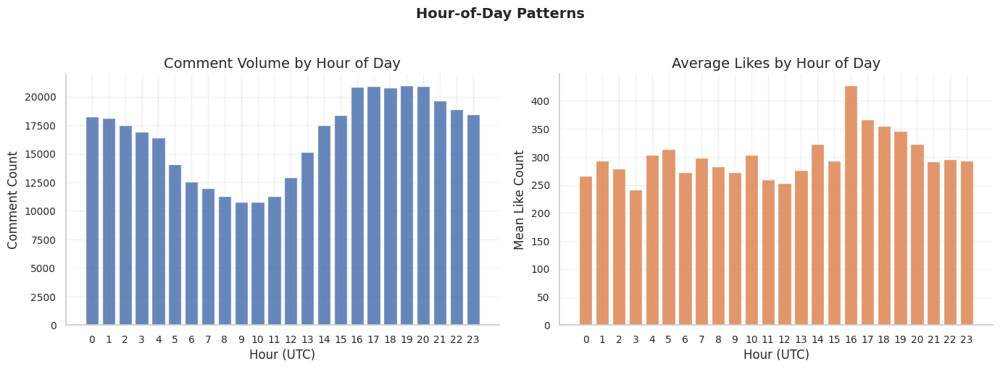

In [44]:
# ── Hour-of-day distribution ──────────────────────────────────────────────────
df_ts["hour"] = df_ts["published_at"].dt.hour

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

hour_counts = df_ts.groupby("hour").size()
axes[0].bar(hour_counts.index, hour_counts.values, color=COLOR_PRIMARY, alpha=0.85)
axes[0].set_title("Comment Volume by Hour of Day")
axes[0].set_xlabel("Hour (UTC)")
axes[0].set_ylabel("Comment Count")
axes[0].set_xticks(range(0, 24))
sns.despine(ax=axes[0])

hour_likes = df_ts.groupby("hour")["like_count"].mean()
axes[1].bar(hour_likes.index, hour_likes.values, color=COLOR_SECONDARY, alpha=0.85)
axes[1].set_title("Average Likes by Hour of Day")
axes[1].set_xlabel("Hour (UTC)")
axes[1].set_ylabel("Mean Like Count")
axes[1].set_xticks(range(0, 24))
sns.despine(ax=axes[1])

plt.suptitle("Hour-of-Day Patterns", fontsize=14, fontweight="bold", y=1.02)
plt.tight_layout()
plt.show()

── Time Lag (Publish → Crawl) Statistics ──



count              395633.000
mean                  846.975
std                   963.972
min                     0.000
p1                      0.518
p5                      6.897
p10                    21.246
p25                   128.990
median                437.862
p75                  1340.617
p90                  2305.396
p95                  2855.914
p99                  3843.402
max                  5966.723
iqr                  1211.627
cv                      1.138
skewness                1.436
kurtosis                1.455
normality_pvalue        0.000
dtype: float64

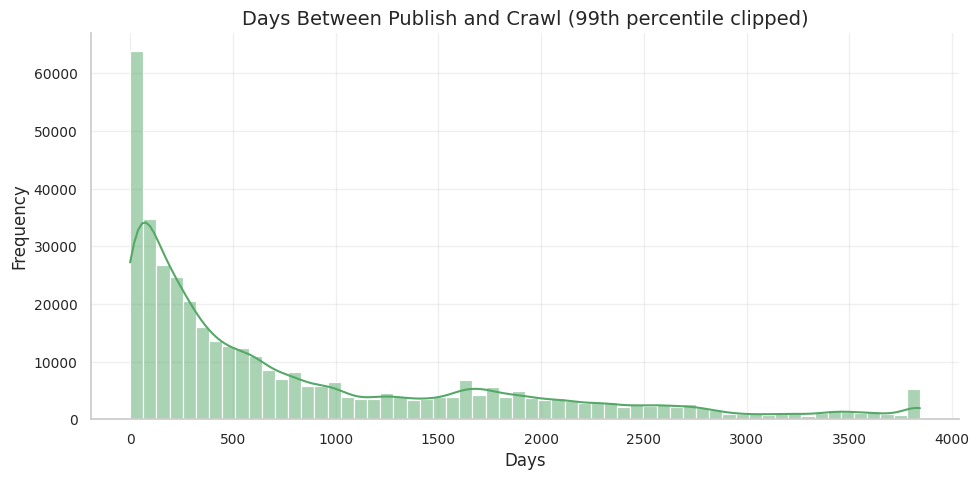

In [45]:
# ── Time between publish and crawl ────────────────────────────────────────────
if df_ts["crawled_at"].dt.tz is None:
    df_ts["crawled_at"] = df_ts["crawled_at"].dt.tz_localize("UTC")
df_ts["lag_hours"] = (df_ts["crawled_at"] - df_ts["published_at"]).dt.total_seconds() / 3600
df_ts["lag_days"] = df_ts["lag_hours"] / 24

print("── Time Lag (Publish → Crawl) Statistics ──\n")
lag_stats = distribution_stats(df_ts["lag_days"])
display(lag_stats)

fig, ax = plt.subplots(figsize=(10, 5))
plots.plot_histogram(
    df_ts["lag_days"].clip(upper=df_ts["lag_days"].quantile(0.99)),
    ax=ax, bins=60, kde=True,
    title="Days Between Publish and Crawl (99th percentile clipped)",
    xlabel="Days",
    color=COLOR_TERTIARY,
)
plt.tight_layout()
plt.show()

## 9. Bivariate & Multivariate Analysis

Correlation analysis, scatter matrices, grouped statistics, cross-tabulations, and pair plots.

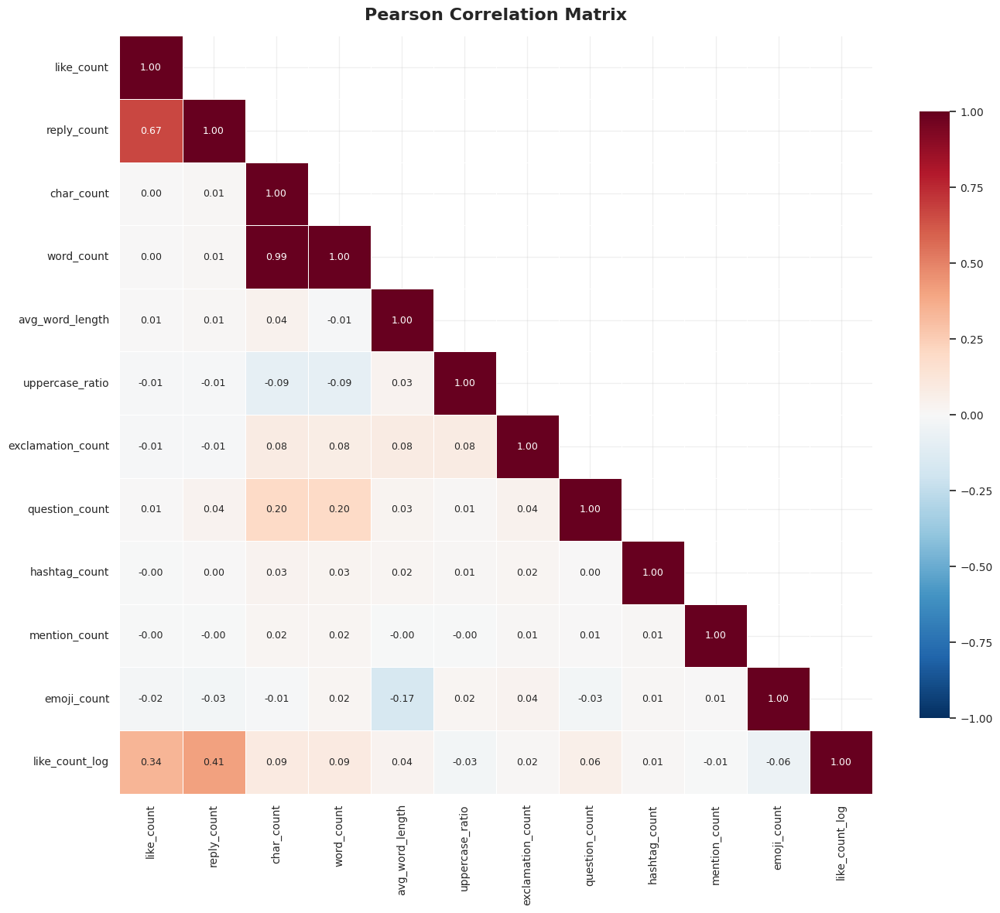

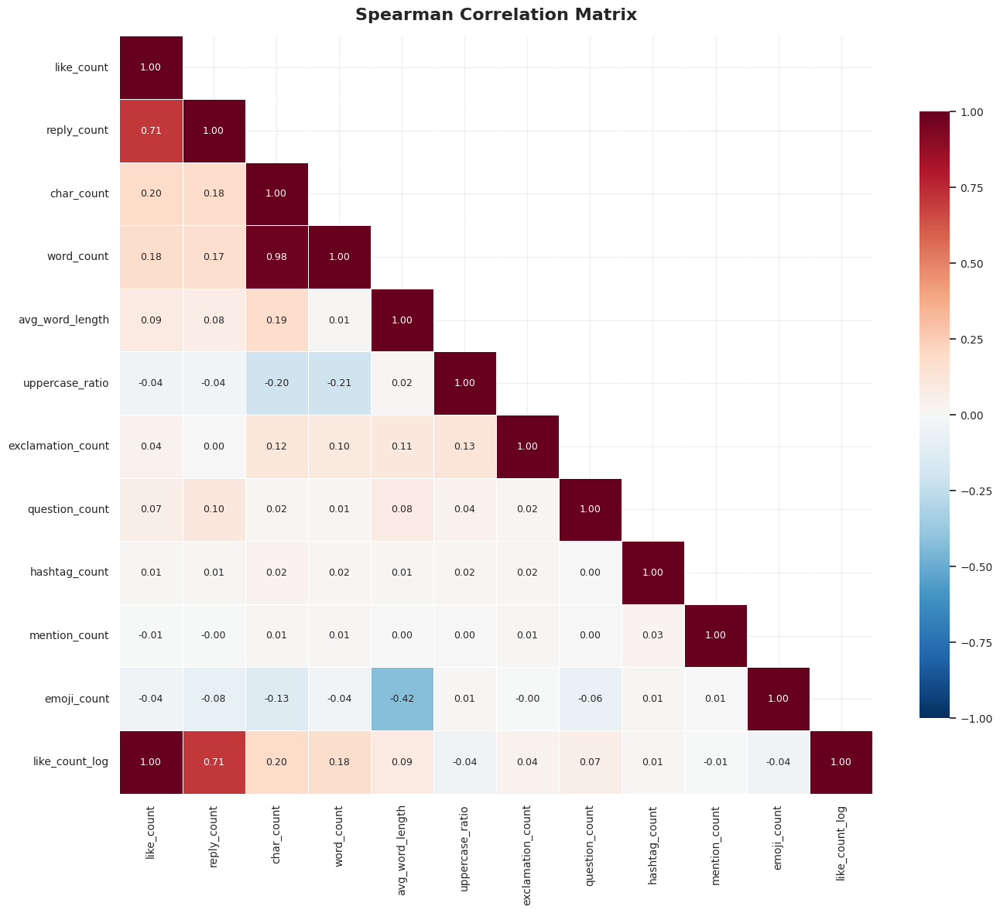

In [46]:
# ── Correlation matrices (Pearson & Spearman) ──────────────────────────────────
corrs = correlation_matrix(df, numeric_cols=NUMERIC_COLS)

for method, corr in corrs.items():
    fig = plots.plot_correlation_heatmap(
        corr, title=f"{method.capitalize()} Correlation Matrix",
        figsize=(14, 12)
    )
    plt.show()

In [47]:
# ── Top correlation pairs ───────────────────────────────────────────────────────
print("── Top 20 Correlation Pairs (Pearson) ──\n")
display(top_correlations(corrs["pearson"], n=20, absolute=True))

print("\n── Top 20 Correlation Pairs (Spearman) ──\n")
display(top_correlations(corrs["spearman"], n=20, absolute=True))

── Top 20 Correlation Pairs (Pearson) ──



,var1,var2,correlation
21,char_count,word_count,0.994
0,like_count,reply_count,0.672
20,reply_count,like_count_log,0.407
10,like_count,like_count_log,0.337
25,char_count,question_count,0.200
33,word_count,question_count,0.198
43,avg_word_length,emoji_count,-0.166
29,char_count,like_count_log,0.092
31,word_count,uppercase_ratio,-0.090
23,char_count,uppercase_ratio,-0.089



── Top 20 Correlation Pairs (Spearman) ──



,var1,var2,correlation
10,like_count,like_count_log,1.000
21,char_count,word_count,0.977
0,like_count,reply_count,0.706
20,reply_count,like_count_log,0.706
43,avg_word_length,emoji_count,-0.422
31,word_count,uppercase_ratio,-0.209
23,char_count,uppercase_ratio,-0.204
29,char_count,like_count_log,0.195
1,like_count,char_count,0.195
22,char_count,avg_word_length,0.186


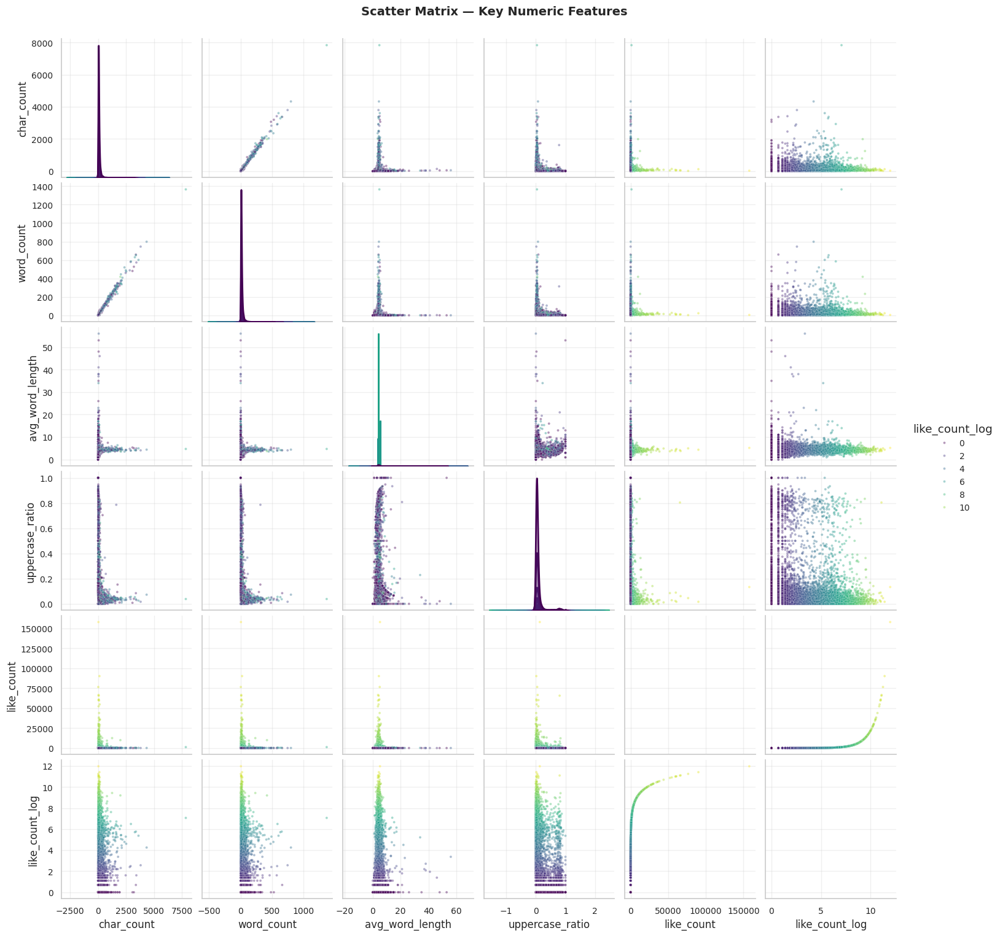

In [48]:
# ── Scatter matrix (sampled) ───────────────────────────────────────────────────
scatter_cols = ["char_count", "word_count", "avg_word_length", "uppercase_ratio", "like_count", "like_count_log"]
sample = df[scatter_cols].sample(min(20000, len(df)), random_state=42)

g = sns.pairplot(sample, vars=scatter_cols, hue="like_count_log",
                palette="viridis", diag_kind="kde",
                plot_kws={"alpha": 0.4, "s": 8}, diag_kws={"linewidth": 2})
g.fig.suptitle("Scatter Matrix — Key Numeric Features", fontsize=14, fontweight="bold", y=1.02)
plt.show()

In [49]:
# ── Grouped statistics by source_query ─────────────────────────────────────────
print("── Grouped Statistics by Source Query ──\n")
grouped = grouped_stats(df, group_col="source_query",
                        value_cols=["like_count", "reply_count", "char_count", "word_count"])
display(grouped.sort_values("like_count_mean", ascending=False))

── Grouped Statistics by Source Query ──



,like_count_mean,like_count_median,like_count_std,like_count_min,like_count_max,like_count_count,reply_count_mean,reply_count_median,reply_count_std,reply_count_min,reply_count_max,reply_count_count,char_count_mean,char_count_median,char_count_std,char_count_min,char_count_max,char_count_count,word_count_mean,word_count_median,word_count_std,word_count_min,word_count_max,word_count_count
source_query,,,,,,,,,,,,,,,,,,,,,,,,
Ariana Grande official music video,1157.564,250.000,4931.230,0,157838,19074,13.924,4.000,37.869,0,999,19074,77.262,51.000,181.473,0,4104,19074,15.077,10.000,34.831,0,851,19074
Billie Eilish official music video,839.201,94.000,4527.565,0,200123,19324,11.067,2.000,42.862,0,1000,19324,94.839,55.000,184.775,0,5457,19324,18.451,11.000,35.385,0,1057,19324
Beyonce official music video,801.085,111.000,3089.439,0,199797,19999,12.306,2.000,36.623,0,1000,19999,87.754,51.000,222.819,0,5018,19999,17.289,10.000,42.291,0,902,19999
Adele official music video,440.211,50.000,1946.998,0,59534,10199,9.568,1.000,34.644,0,897,10199,116.010,59.000,242.344,0,2785,10199,22.624,12.000,46.299,0,574,10199
bad movie review,419.178,3.000,2216.188,0,78344,12223,3.072,0.000,13.273,0,511,12223,128.275,88.000,152.082,0,5397,12223,24.436,17.000,28.493,0,1040,12223
Ariana Grande live performance,410.109,10.000,1866.414,0,43459,16414,3.878,0.000,16.504,0,470,16414,80.634,49.000,159.463,0,2848,16414,15.900,10.000,31.107,0,623,16414
Billie Eilish live performance,335.325,5.000,2089.768,0,115819,15925,3.208,0.000,14.912,0,548,15925,79.870,49.000,151.357,0,8019,15925,15.780,10.000,29.078,0,1524,15925
live concert performance,311.770,6.000,2248.173,0,101545,18529,4.895,0.000,28.290,0,1001,18529,81.489,52.000,132.229,0,3500,18529,15.886,10.000,24.759,0,627,18529
official movie trailer,272.816,1.000,3018.540,0,137536,14126,3.050,0.000,20.415,0,793,14126,69.830,51.000,78.723,0,4052,14126,13.526,10.000,14.501,0,711,14126


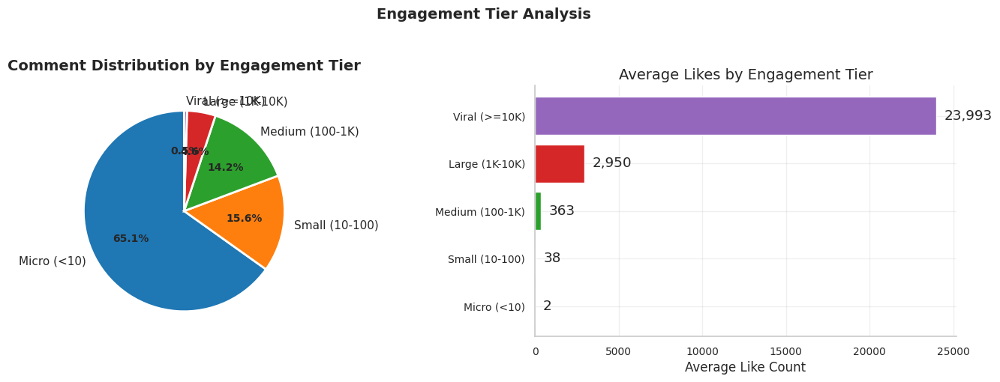

In [50]:
# ── Engagement tiers ───────────────────────────────────────────────────────────
df["engagement_tier"] = engagement_tier(df["like_count"])

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

tier_counts = df["engagement_tier"].value_counts()
plots.plot_pie(df["engagement_tier"], ax=axes[0],
               title="Comment Distribution by Engagement Tier")

tier_avg = df.groupby("engagement_tier", observed=True)["like_count"].mean().reindex(
    ["Micro (<10)", "Small (10-100)", "Medium (100-1K)", "Large (1K-10K)", "Viral (>=10K)"]
)
axes[1].barh(tier_avg.index.astype(str), tier_avg.values, color=plots.get_colors(5))
axes[1].set_title("Average Likes by Engagement Tier")
axes[1].set_xlabel("Average Like Count")
for i, v in enumerate(tier_avg.values):
    axes[1].text(v + tier_avg.max() * 0.02, i, f"{v:,.0f}", va="center")
sns.despine(ax=axes[1])

plt.suptitle("Engagement Tier Analysis", fontsize=14, fontweight="bold", y=1.02)
plt.tight_layout()
plt.show()

── Cross-tabulation: Source Query × Engagement Tier (% per row) ──



engagement_tier,Micro (<10),Small (10-100),Medium (100-1K),Large (1K-10K),Viral (>=10K)
source_query,,,,,
Adele live performance,75.380,14.320,8.160,2.040,0.100
Adele official music video,35.460,24.390,32.660,6.900,0.580
Adele reaction,80.750,13.180,5.130,0.930,0.010
Ariana Grande live performance,50.710,22.590,19.370,6.650,0.680
Ariana Grande official music video,30.830,7.600,43.030,16.720,1.820
Ariana Grande reaction,82.420,12.200,4.300,1.070,0.000
Beyonce live performance,57.000,24.900,13.680,4.210,0.200
Beyonce official music video,29.110,19.620,35.660,14.520,1.100
Beyonce reaction,83.220,12.960,3.350,0.470,0.000


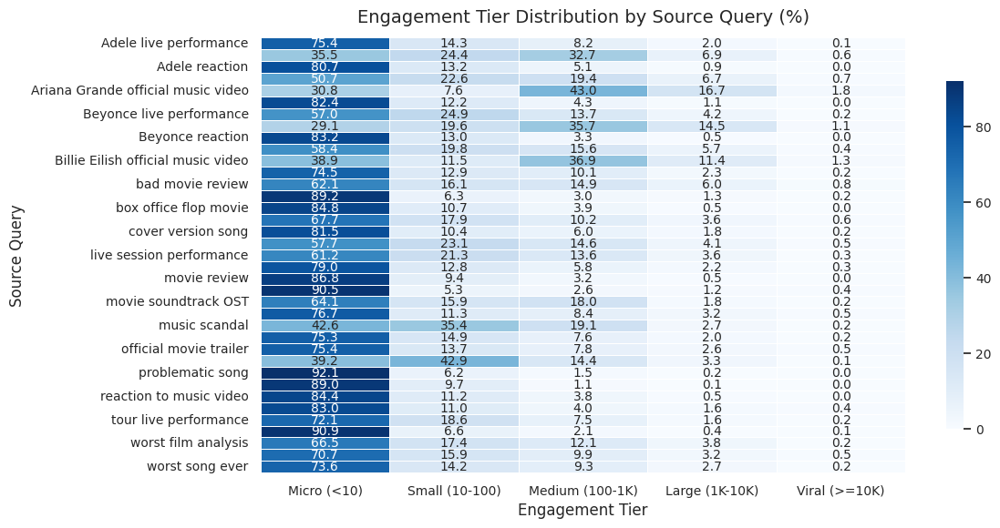

In [51]:
# ── Cross-tabulation: source_query × engagement_tier ─────────────────────────
ct = pd.crosstab(df["source_query"], df["engagement_tier"], normalize="index") * 100
tier_order = ["Micro (<10)", "Small (10-100)", "Medium (100-1K)", "Large (1K-10K)", "Viral (>=10K)"]
ct = ct.reindex(columns=[c for c in tier_order if c in ct.columns])

print("── Cross-tabulation: Source Query × Engagement Tier (% per row) ──\n")
display(ct.round(2))

fig, ax = plt.subplots(figsize=(12, 6))
plots.plot_heatmap(ct, ax=ax, cmap="Blues", fmt=".1f",
                  title="Engagement Tier Distribution by Source Query (%)",
                  annot_kws={"size": 10})
ax.set_xlabel("Engagement Tier")
ax.set_ylabel("Source Query")
plt.tight_layout()
plt.show()

## 10. Labeled Data / Sentiment Analysis

Analyse the labeled subset: sentiment distribution, engagement by sentiment class, text characteristics, and n-grams per class.

In [52]:
# ── Labeled data overview ─────────────────────────────────────────────────────
print("── Labeled Dataset Overview ──\n")
print(f"  Total labeled records : {len(df_labels):,}")
print(f"  Unique comment_ids   : {df_labels['comment_id'].nunique():,}")
print(f"  Unique posts          : {df_labels['post_id'].nunique():,}")
print(f"  Labeler model         : {df_labels['model'].unique().tolist()}")

print("\n── Sentiment Distribution ──\n")
label_counts = df_labels["label"].value_counts()
display(label_counts)
display(label_counts / len(df_labels) * 100)

── Labeled Dataset Overview ──

  Total labeled records : 425,636
  Unique comment_ids   : 395,633
  Unique posts          : 1,331
  Labeler model         : ['deepseek-v4-flash']

── Sentiment Distribution ──



label
positive    239724
neutral      98247
negative     87665
Name: count, dtype: int64

label
positive   56.321
neutral    23.082
negative   20.596
Name: count, dtype: float64

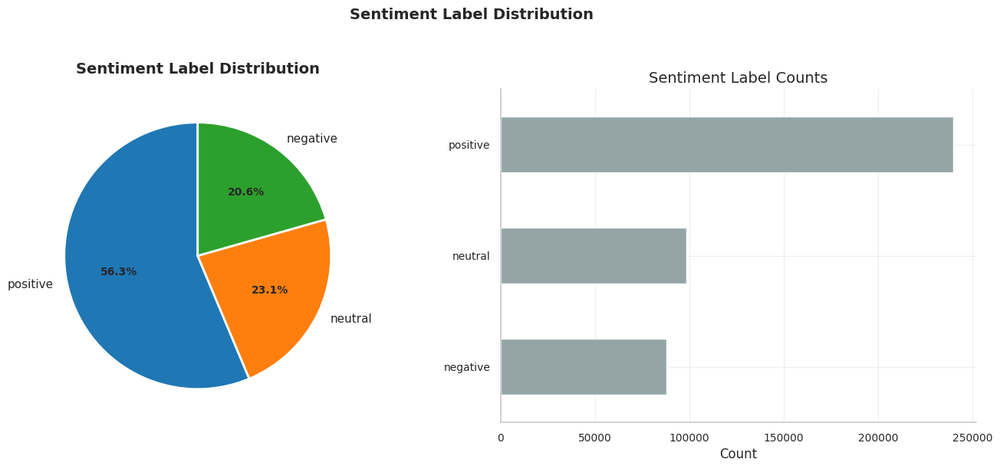

In [53]:
# ── Sentiment distribution plots ─────────────────────────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

plots.plot_pie(df_labels["label"], ax=axes[0],
               title="Sentiment Label Distribution", n=10)

plots.plot_bar(df_labels["label"], ax=axes[1],
               n=10, title="Sentiment Label Counts",
               xlabel="Count", horizontal=True,
               palette=[plots.PALETTE["neutral"],
                        plots.PALETTE["positive"],
                        plots.PALETTE["negative"]])

plt.suptitle("Sentiment Label Distribution", fontsize=14, fontweight="bold", y=1.02)
plt.tight_layout()
plt.show()

In [54]:
# ── Merge labels onto main df for analysis ───────────────────────────────────
df_labeled = df_full[df_full["label"].notna()].copy()
print(f"Labeled rows in merged df: {len(df_labeled):,}")

# Engagement by sentiment
print("\n── Engagement Stats by Sentiment ──\n")
sent_engage = df_labeled.groupby("label").agg(
    count=("like_count", "count"),
    mean_likes=("like_count", "mean"),
    median_likes=("like_count", "median"),
    mean_replies=("reply_count", "mean"),
    median_replies=("reply_count", "median"),
    mean_char_count=("char_count", "mean"),
    mean_word_count=("word_count", "mean"),
).round(3)
display(sent_engage)

Labeled rows in merged df: 425,636

── Engagement Stats by Sentiment ──



,count,mean_likes,median_likes,mean_replies,median_replies,mean_char_count,mean_word_count
label,,,,,,,
negative,87665,263.648,1.000,3.329,0.000,112.620,21.475
neutral,98247,335.401,2.000,5.715,0.000,100.993,19.370
positive,239724,335.112,4.000,3.764,0.000,90.343,17.725


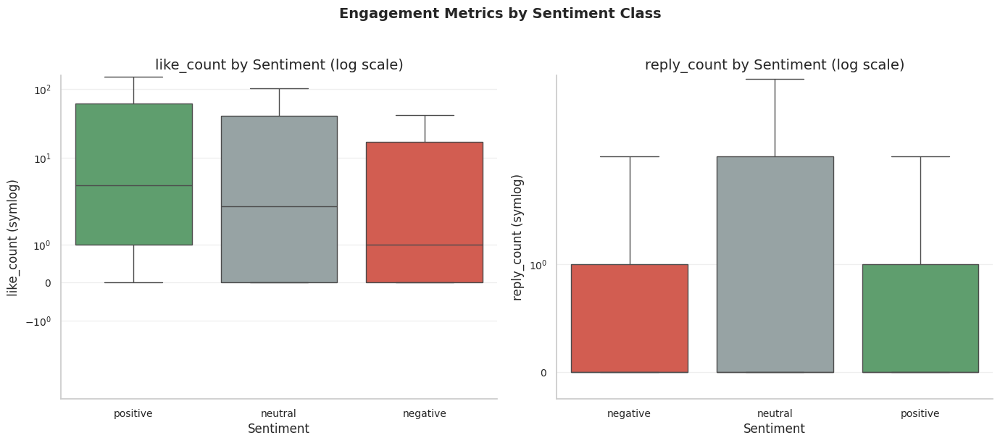

In [55]:
# ── Box plot: engagement by sentiment ────────────────────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

for i, col in enumerate(["like_count", "reply_count"]):
    order = df_labeled.groupby("label")[col].median().sort_values(ascending=False).index
    sns.boxplot(data=df_labeled, x="label", y=col, ax=axes[i],
                order=order, palette={"positive": plots.PALETTE["tertiary"],
                                     "neutral": plots.PALETTE["neutral"],
                                     "negative": plots.PALETTE["negative"]},
                showfliers=False)
    axes[i].set_yscale("symlog")
    axes[i].set_title(f"{col} by Sentiment (log scale)")
    axes[i].set_xlabel("Sentiment")
    axes[i].set_ylabel(f"{col} (symlog)")

plt.suptitle("Engagement Metrics by Sentiment Class", fontsize=14, fontweight="bold", y=1.02)
plt.tight_layout()
plt.show()

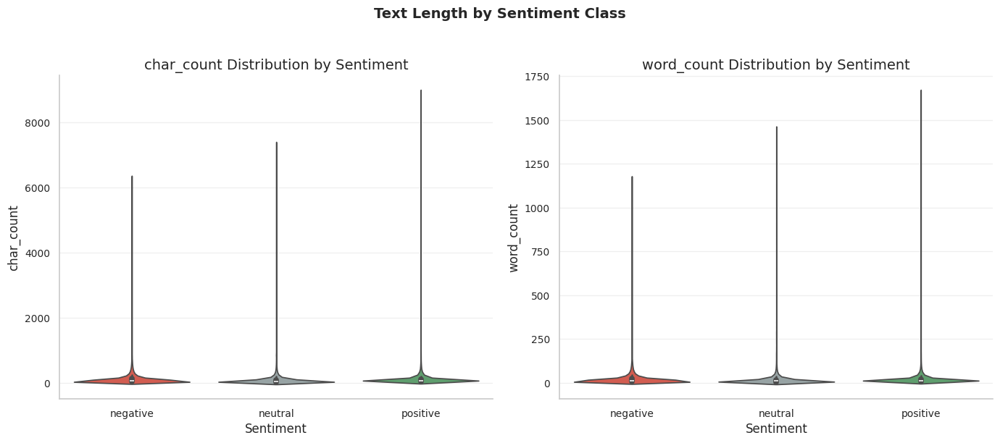

In [56]:
# ── Violin plot: text length by sentiment ────────────────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

for i, col in enumerate(["char_count", "word_count"]):
    sns.violinplot(data=df_labeled, x="label", y=col, ax=axes[i],
                   palette={"positive": plots.PALETTE["tertiary"],
                            "neutral": plots.PALETTE["neutral"],
                            "negative": plots.PALETTE["negative"]},
                   inner="box")
    axes[i].set_title(f"{col} Distribution by Sentiment")
    axes[i].set_xlabel("Sentiment")
    axes[i].set_ylabel(col)

plt.suptitle("Text Length by Sentiment Class", fontsize=14, fontweight="bold", y=1.02)
plt.tight_layout()
plt.show()

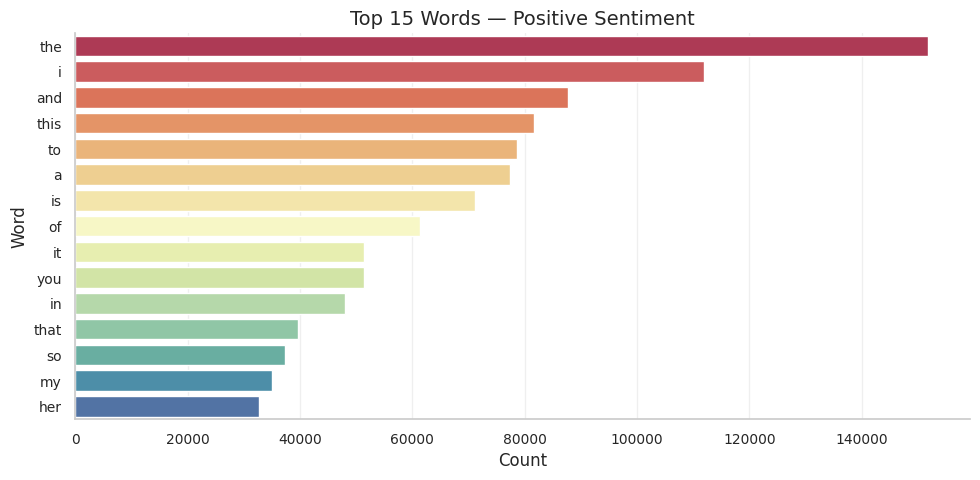

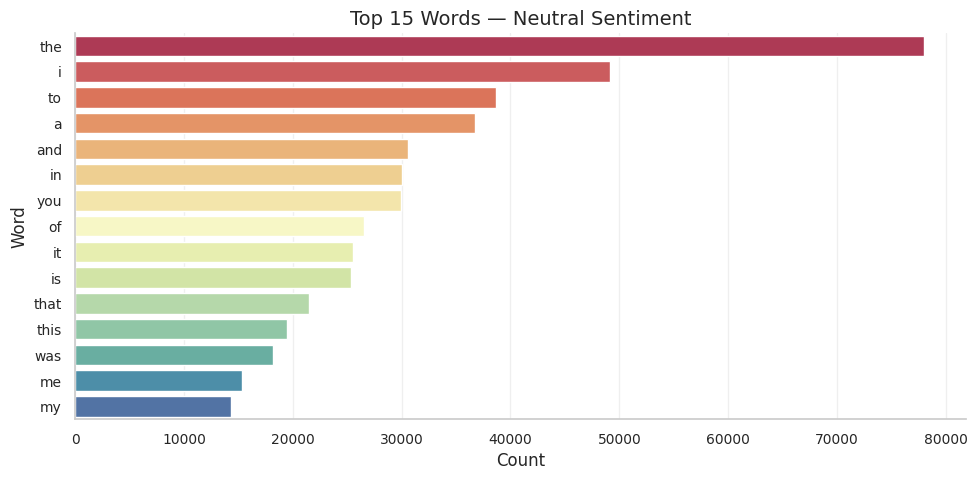

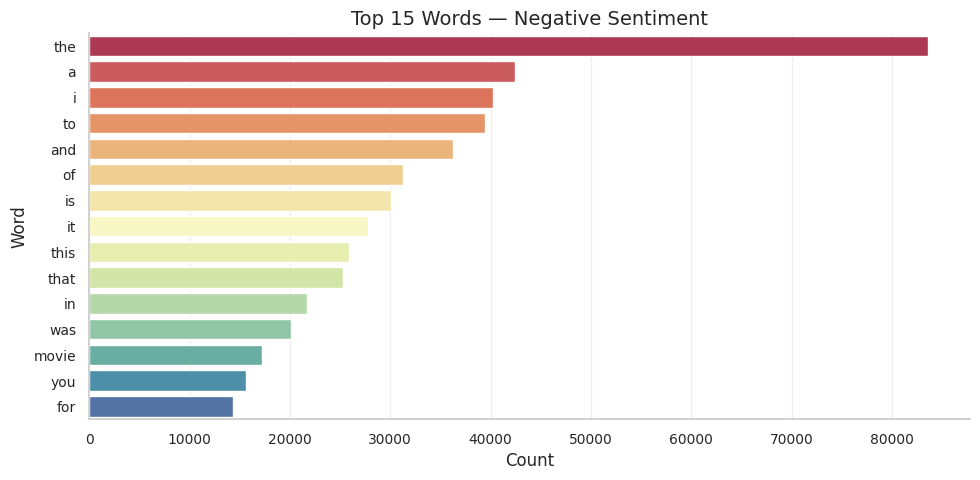

In [57]:
# ── N-grams per sentiment class ──────────────────────────────────────────────
sentiment_words = sentiment_word_summary(df_labeled, text_col="comment_text",
                                         label_col="label", top_n=20)

for label, top_words in sentiment_words.items():
    if top_words.empty:
        continue
    fig, ax = plt.subplots(figsize=(10, 5))
    sns.barplot(data=top_words.head(15), x="count", y="1-gram", ax=ax,
                palette="Spectral")
    ax.set_title(f"Top 15 Words — {label.capitalize()} Sentiment")
    ax.set_xlabel("Count")
    ax.set_ylabel("Word")
    plt.tight_layout()
    plt.show()

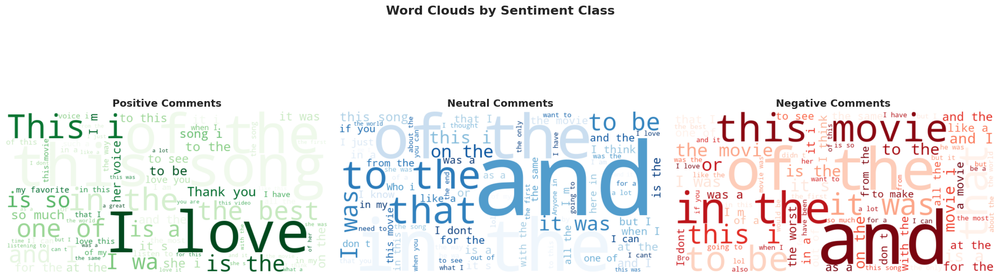

In [58]:
# ── Word clouds per sentiment class ─────────────────────────────────────────
label_colors = {
    "positive": "Greens",
    "neutral": "Blues",
    "negative": "Reds",
}

fig, axes = plt.subplots(1, 3, figsize=(18, 6))

for i, (label, cmap) in enumerate(label_colors.items()):
    text = " ".join(df_labeled[df_labeled["label"] == label]["comment_text"].dropna().astype(str))
    if text.strip():
        try:
            plot_wordcloud(text, ax=axes[i], colormap=cmap, max_words=80)
            axes[i].set_title(f"{label.capitalize()} Comments", fontsize=13, fontweight="bold")
        except Exception as e:
            axes[i].text(0.5, 0.5, f"Error: {e}", ha="center", va="center")

plt.suptitle("Word Clouds by Sentiment Class", fontsize=16, fontweight="bold", y=1.02)
plt.tight_layout()
plt.show()

── Emoji Usage by Sentiment ──



,mean,median,std
label,,,
negative,0.365,0.000,1.421
neutral,0.374,0.000,1.546
positive,0.962,0.000,2.548


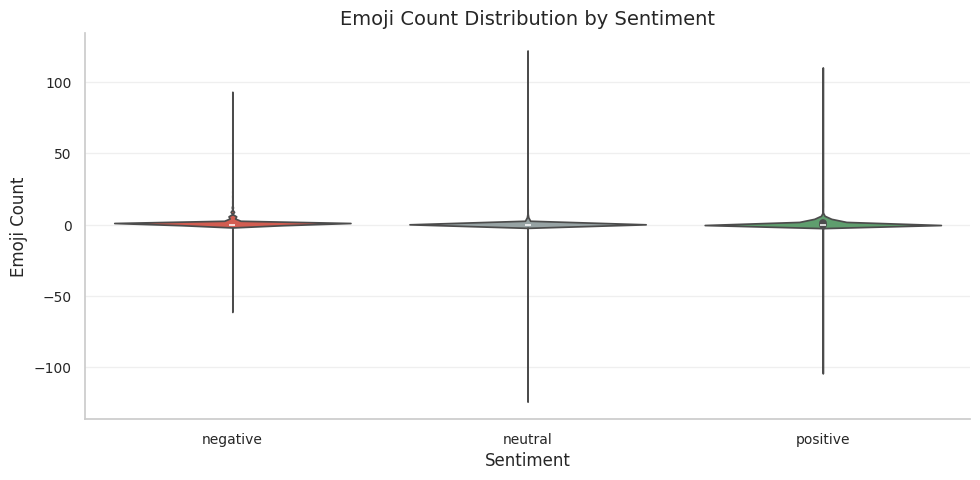

In [59]:
# ── Emoji usage by sentiment ─────────────────────────────────────────────────
emoji_by_sentiment = df_labeled.groupby("label")["emoji_count"].agg(["mean", "median", "std"]).round(3)
print("── Emoji Usage by Sentiment ──\n")
display(emoji_by_sentiment)

fig, ax = plt.subplots(figsize=(10, 5))
sns.violinplot(data=df_labeled, x="label", y="emoji_count", ax=ax,
               palette={"positive": plots.PALETTE["tertiary"],
                        "neutral": plots.PALETTE["neutral"],
                        "negative": plots.PALETTE["negative"]},
               inner="box")
ax.set_title("Emoji Count Distribution by Sentiment")
ax.set_xlabel("Sentiment")
ax.set_ylabel("Emoji Count")
plt.tight_layout()
plt.show()

In [60]:
# ── Labeler model analysis ────────────────────────────────────────────────────
print("── Labeling Model Distribution ──\n")
display(df_labels["model"].value_counts())

# Sentiment distribution per model
print("\n── Sentiment Distribution per Model ──\n")
display(pd.crosstab(df_labels["model"], df_labels["label"], normalize="index").round(3) * 100)

── Labeling Model Distribution ──



model
deepseek-v4-flash    425636
Name: count, dtype: int64


── Sentiment Distribution per Model ──



label,negative,neutral,positive
model,,,
deepseek-v4-flash,20.600,23.100,56.300


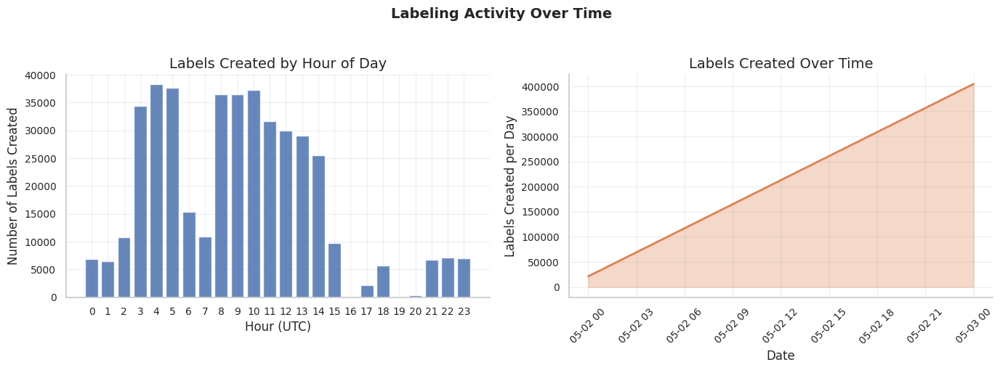

In [61]:
# ── Labeling timestamp analysis ─────────────────────────────────────────────
df_labels_ts = df_labels.copy()
df_labels_ts["labeled_hour"] = df_labels_ts["labeled_at"].dt.hour
df_labels_ts["labeled_date"] = df_labels_ts["labeled_at"].dt.date

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

hour_dist = df_labels_ts.groupby("labeled_hour").size()
axes[0].bar(hour_dist.index, hour_dist.values, color=COLOR_PRIMARY, alpha=0.85)
axes[0].set_title("Labels Created by Hour of Day")
axes[0].set_xlabel("Hour (UTC)")
axes[0].set_ylabel("Number of Labels Created")
axes[0].set_xticks(range(0, 24))
sns.despine(ax=axes[0])

daily_labels = df_labels_ts.groupby("labeled_date").size()
axes[1].plot(daily_labels.index, daily_labels.values,
             color=COLOR_SECONDARY, linewidth=2)
axes[1].fill_between(daily_labels.index, daily_labels.values, alpha=0.3, color=COLOR_SECONDARY)
axes[1].set_title("Labels Created Over Time")
axes[1].set_xlabel("Date")
axes[1].set_ylabel("Labels Created per Day")
axes[1].tick_params(axis="x", rotation=45)
sns.despine(ax=axes[1])

plt.suptitle("Labeling Activity Over Time", fontsize=14, fontweight="bold", y=1.02)
plt.tight_layout()
plt.show()

## 11. Key Insights

Automated data quality profiling and top findings.

In [62]:
# ── Automated summary statistics per column ───────────────────────────────────
print("── Automated Distribution Summary (All Numeric Columns) ──\n")
summary_frames = []
for col in NUMERIC_COLS:
    if col in df.columns:
        summary_frames.append(distribution_stats(df[col]).rename(col))

full_summary = pd.concat(summary_frames, axis=1).T
full_summary.index.name = "column"
display(full_summary)

── Automated Distribution Summary (All Numeric Columns) ──



,count,mean,std,min,p1,p5,p10,p25,median,p75,p90,p95,p99,max,iqr,cv,skewness,kurtosis,normality_pvalue
column,,,,,,,,,,,,,,,,,,,
like_count,395633.000,306.306,2406.248,0.000,0.000,0.000,0.000,0.000,3.000,40.000,399.000,1018.000,5572.680,484279.000,40.000,7.856,47.020,5442.859,0.000
reply_count,395633.000,4.077,22.036,0.000,0.000,0.000,0.000,0.000,0.000,1.000,8.000,18.000,67.000,1001.000,1.000,5.405,19.421,566.348,0.000
char_count,395633.000,95.746,171.216,0.000,4.000,12.000,17.000,31.000,57.000,101.000,184.000,279.000,732.000,8982.000,70.000,1.788,11.013,233.413,0.000
word_count,395633.000,18.590,32.045,0.000,1.000,2.000,4.000,6.000,11.000,20.000,36.000,53.000,136.000,1668.000,14.000,1.724,10.869,226.714,0.000
avg_word_length,395633.000,4.236,2.286,0.000,1.000,2.643,3.125,3.667,4.154,4.646,5.250,5.833,8.000,613.999,0.979,0.540,107.037,22720.994,0.000
uppercase_ratio,395633.000,0.072,0.143,0.000,0.000,0.000,0.000,0.017,0.034,0.062,0.125,0.273,0.816,1.000,0.045,1.974,4.195,18.188,0.000
exclamation_count,395633.000,0.316,1.323,-86.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,2.000,5.000,126.000,0.000,4.193,16.981,1016.151,0.000
question_count,395633.000,0.138,0.659,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,3.000,78.000,0.000,4.770,22.995,1513.135,0.000
hashtag_count,395633.000,0.005,0.105,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,25.000,0.000,22.523,79.555,13389.236,0.000


In [65]:
# ── Final memory summary ──────────────────────────────────────────────────────
print("\n── Final Memory Summary ──\n")
for name, df_obj in [("df (main)", df), ("df_labels", df_labels), ("df_full (merged)", df_full)]:
    mem = df_obj.memory_usage(deep=True).sum() / (1024 ** 2)
    print(f"  {name:<25} {mem:>10.2f} MB")

print(f"\n{'='*60}")
print("EDA COMPLETE — YouTube Comments Dataset")
print(f"{'='*60}")


── Final Memory Summary ──

  df (main)                     277.75 MB
  df_labels                     116.71 MB
  df_full (merged)              302.66 MB

EDA COMPLETE — YouTube Comments Dataset
